In [20]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import itertools
from scipy import stats
import shap
from sklearn.ensemble import GradientBoostingRegressor
import numpy as np

In [11]:
# Load datasets
original_df = pd.read_excel('Dataset.xlsx')

# Clean column names
cleaned_columns = {
    col: col.replace(' ', '').replace('(%', '').replace(')','').replace('\n', '')
    for col in original_df.columns
}
original_df.rename(columns=cleaned_columns, inplace=True)

original_df = pd.get_dummies(original_df, columns=['Location'])

gan_df = pd.read_csv('GAN_synthetic_data.csv')
vae_df = pd.read_csv('VAE_synthetic_data.csv')

In [12]:
# Descriptive statistics
original_stats = original_df.describe()
gan_stats = gan_df.describe()
vae_stats = vae_df.describe()

# Print stats for comparison
print("Original Dataset Statistics:\n", original_stats)
print("\nGAN Dataset Statistics:\n", gan_stats)
print("\nVAE Dataset Statistics:\n", vae_stats)


Original Dataset Statistics:
                 C           H           N           O           S          VM  \
count  186.000000  186.000000  186.000000  186.000000  186.000000  186.000000   
mean    49.506202    6.418846    1.793219   42.060283    0.221450   75.465442   
std      4.002631    1.037071    1.949253    5.059810    0.392152    9.172079   
min     40.020000    5.320000    0.100000   27.360000    0.000000   49.357766   
25%     47.014626    5.980000    0.490884   39.366227    0.000000   71.700000   
50%     48.867116    6.174469    1.171271   43.280000    0.000000   76.555556   
75%     52.846674    6.500000    2.189781   45.557022    0.310034   81.797235   
max     60.460000   10.762332    8.210000   52.860000    1.552259   94.161220   

              Ash          FC         Cel         Hem         Lig  \
count  186.000000  186.000000  186.000000  186.000000  186.000000   
mean     8.694476   15.840234   33.685306   26.992285   21.840139   
std      9.878574    6.382265    

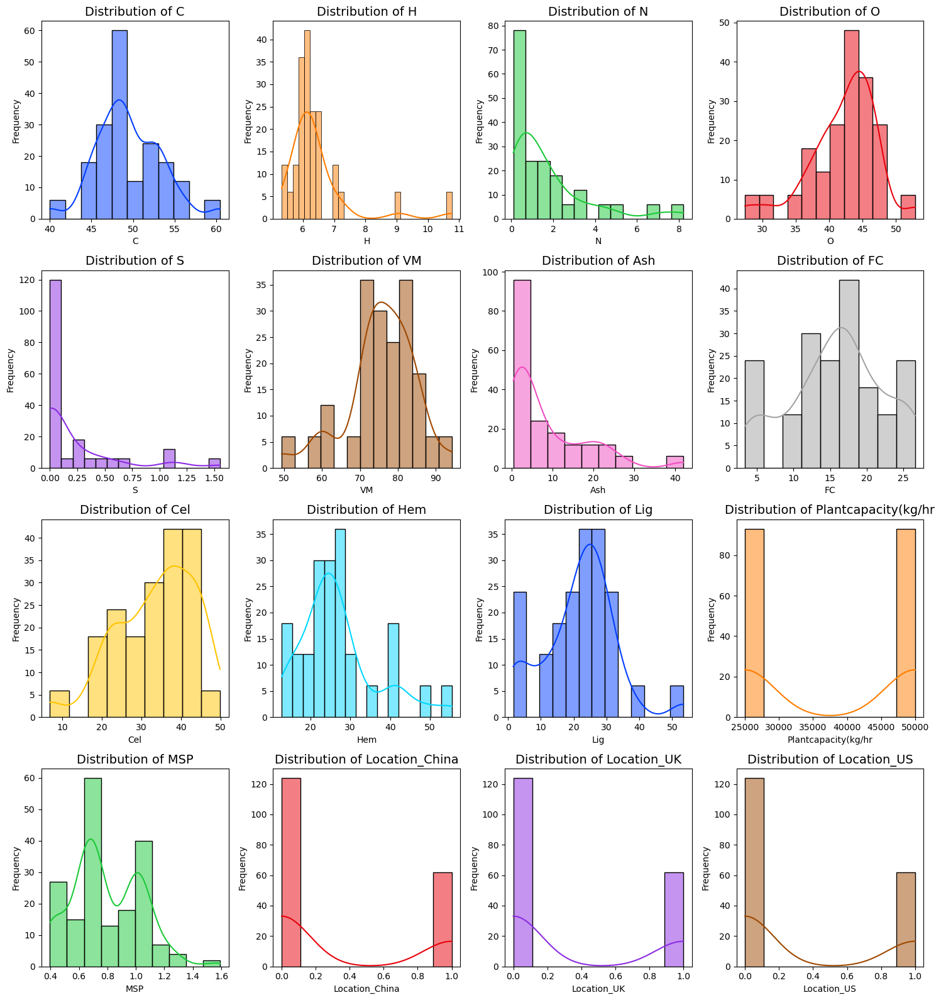

In [4]:
# Determining the number of rows needed for subplots
num_cols = len(original_df.columns)
num_rows = num_cols // 4 + (num_cols % 4 > 0)

# Create a color palette
palette = itertools.cycle(sns.color_palette("bright"))

# Create subplots
fig, axes = plt.subplots(num_rows, 4, figsize=(15, num_rows * 4))

for i, col in enumerate(original_df.columns):
    row = i // 4
    col = i % 4
    color = next(palette)
    sns.histplot(original_df[original_df.columns[i]], kde=True, color=color, ax=axes[row, col])
    axes[row, col].set_title(f'Distribution of {original_df.columns[i]}', fontsize=14)
    axes[row, col].set_xlabel(original_df.columns[i])
    axes[row, col].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


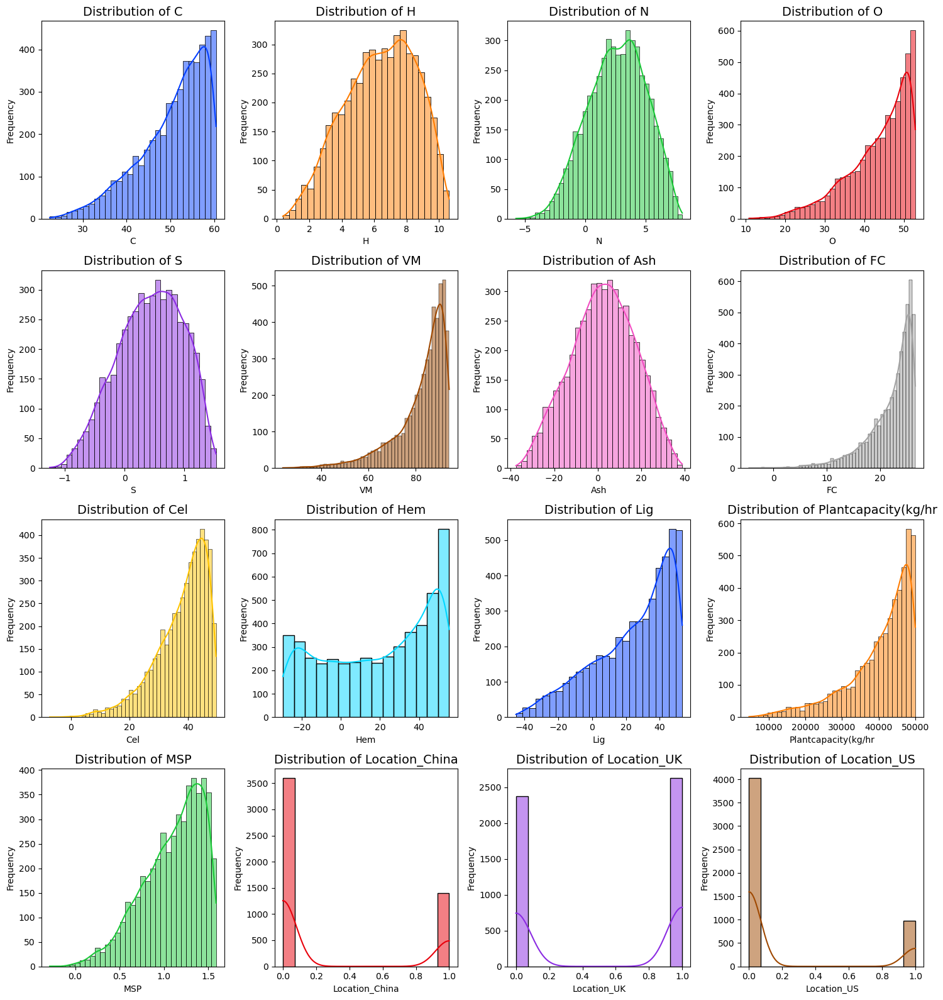

In [5]:
# Determining the number of rows needed for subplots
num_cols = len(gan_df.columns)
num_rows = num_cols // 4 + (num_cols % 4 > 0)

# Create a color palette
palette = itertools.cycle(sns.color_palette("bright"))

# Create subplots
fig, axes = plt.subplots(num_rows, 4, figsize=(15, num_rows * 4))

for i, col in enumerate(gan_df.columns):
    row = i // 4
    col = i % 4
    color = next(palette)
    sns.histplot(gan_df[gan_df.columns[i]], kde=True, color=color, ax=axes[row, col])
    axes[row, col].set_title(f'Distribution of {gan_df.columns[i]}', fontsize=14)
    axes[row, col].set_xlabel(gan_df.columns[i])
    axes[row, col].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

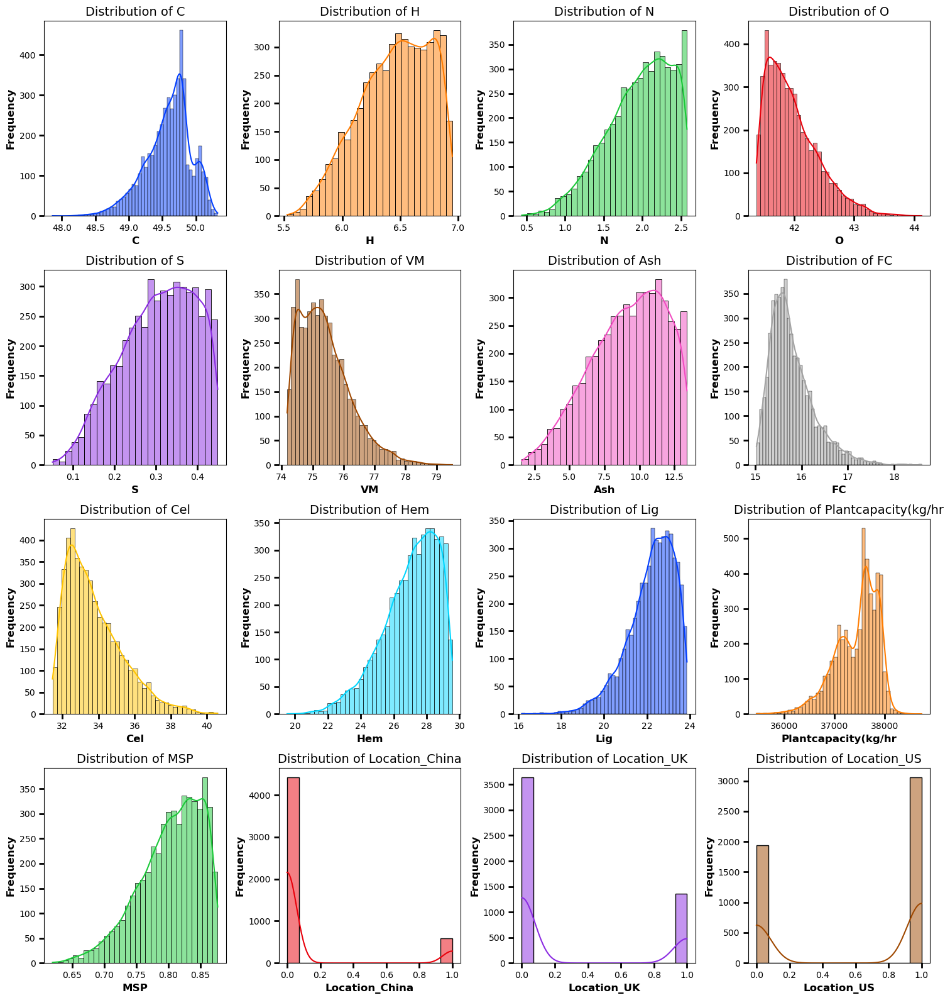

In [6]:
# Determining the number of rows needed for subplots
num_cols = len(vae_df.columns)
num_rows = num_cols // 4 + (num_cols % 4 > 0)

# Create a color palette
palette = itertools.cycle(sns.color_palette("bright"))

# Create subplots
fig, axes = plt.subplots(num_rows, 4, figsize=(15, num_rows * 4))

for i, col in enumerate(vae_df.columns):
    row = i // 4
    col = i % 4
    color = next(palette)
    sns.histplot(vae_df[vae_df.columns[i]], kde=True, color=color, ax=axes[row, col])
    axes[row, col].set_title(f'Distribution of {vae_df.columns[i]}', fontsize=14)
    axes[row, col].set_xlabel(vae_df.columns[i], fontsize=12, weight='bold')  # Increase x-axis text size and make it bold
    axes[row, col].set_ylabel('Frequency', fontsize=12, weight='bold')  # Increase y-axis text size and make it bold
    axes[row, col].tick_params(axis='both', which='major', labelsize=10, width=2, length=6)  # Increase tick size and make them bold

plt.tight_layout()
plt.show()

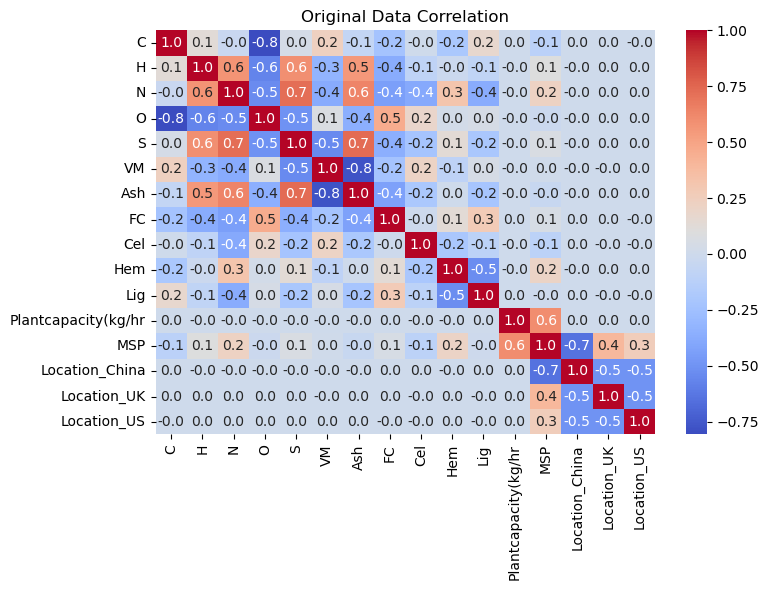

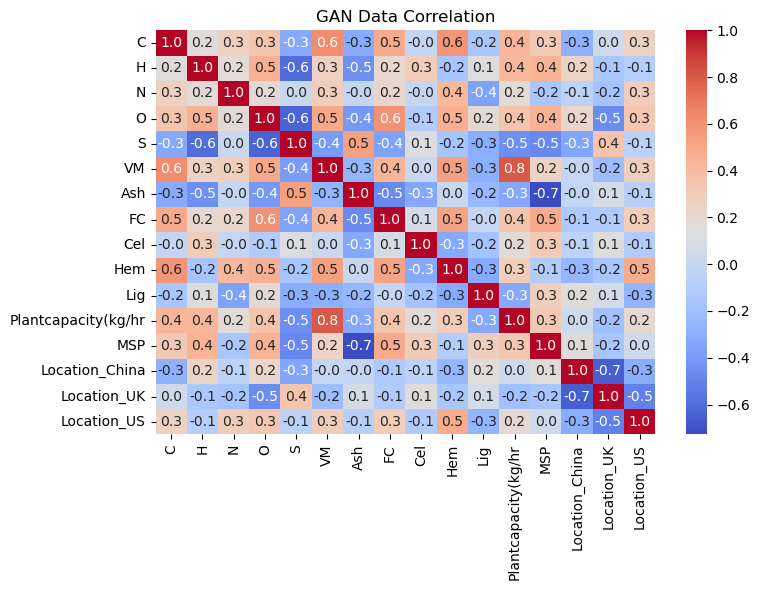

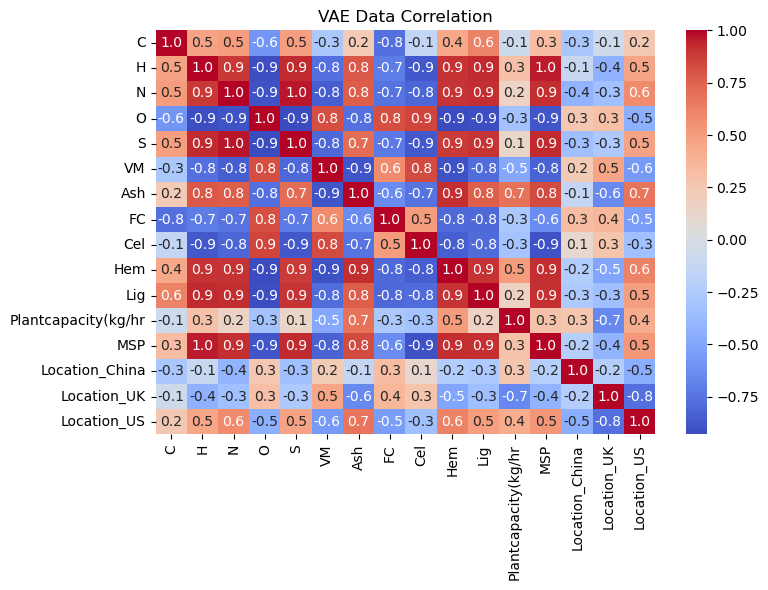

In [7]:
# Correlation matrices
corr_original = original_df.corr()
corr_gan = gan_df.corr()
corr_vae = vae_df.corr()

# Plot heatmaps for original data
plt.figure(figsize=(8, 6))
sns.heatmap(corr_original, cmap='coolwarm', annot=True, fmt=".1f")
plt.title('Original Data Correlation')
plt.tight_layout()
plt.show()

# Plot heatmaps for GAN data
plt.figure(figsize=(8, 6))
sns.heatmap(corr_gan, cmap='coolwarm', annot=True, fmt=".1f")
plt.title('GAN Data Correlation')
plt.tight_layout()
plt.show()

# Plot heatmaps for VAE data
plt.figure(figsize=(8, 6))
sns.heatmap(corr_vae, cmap='coolwarm', annot=True, fmt=".1f")
plt.title('VAE Data Correlation')
plt.tight_layout()
plt.show()


In [8]:
features = original_df.columns

# Calculate the number of rows and columns for subplots
num_rows = len(features) // 2
num_cols = 2 if len(features) % 2 == 0 else 3

# Increase the resolution and size of the figure
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 20), dpi=1000)

# Flatten axes for easy iteration
axes = axes.flatten()

# Iterate through features and plot distributions
for i, feature in enumerate(features):
    # Combine data
    combined_data = pd.DataFrame({
        'Original': original_df[feature],
        'GAN': gan_df[feature],
        'VAE': vae_df[feature]
    })
    
    # Melt for boxplot
    melted_data = combined_data.melt(var_name='Dataset', value_name=feature)
    
    # Boxplot
    sns.boxplot(ax=axes[i], x='Dataset', y=feature, data=melted_data, order=['Original', 'GAN', 'VAE'])
    axes[i].set_title(f'Feature Distribution for {feature}', fontsize=14, weight='bold')  # Make title bold and increase font size
    axes[i].set_xlabel('Dataset', fontsize=12, weight='bold')  # Make x-axis label bold and increase font size
    axes[i].set_ylabel(feature, fontsize=12, weight='bold')  # Make y-axis label bold and increase font size
    axes[i].tick_params(axis='both', which='major', labelsize=10, width=2, length=6)  # Increase tick size and make them bold

# Hide any empty subplots
for j in range(len(features), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
def label_encode_locations(df):
    locations = ['China', 'UK', 'US']
    df['Location'] = df[['Location_China', 'Location_UK', 'Location_US']].idxmax(axis=1).apply(lambda x: locations.index(x.split('_')[1]) + 1)
    df.drop(columns=['Location_China', 'Location_UK', 'Location_US'], inplace=True)
    return df

# Convert encoded locations to label encoding
original_df = label_encode_locations(original_df)
print(original_df)

In [ ]:
gan_df = label_encode_locations(gan_df)
print(gan_df)

In [ ]:
vae_df = label_encode_locations(vae_df)
print(vae_df)

In [24]:
features_to_clean = gan_df.columns.tolist()

print(features_to_clean)
# Step 1: Identify outliers
# Calculate z-scores for each feature
z_scores = stats.zscore(gan_df[features_to_clean])

# Define a threshold for outlier detection (e.g., z-score > 3 or < -3)
outlier_threshold = 3

# Filter out outliers
gan_df_cleaned = gan_df[(z_scores < outlier_threshold).all(axis=1)]

# Step 2: Define realistic bounds based on original data
bounds = original_df.describe().loc[['min', 'max']]

# Step 3: Remove out-of-bound data
for feature in features_to_clean:
    min_bound = bounds[feature]['min']
    max_bound = bounds[feature]['max']
    gan_df_cleaned = gan_df_cleaned[(gan_df_cleaned[feature] >= min_bound) & (gan_df_cleaned[feature] <= max_bound)]

# Step 4: Compare to original data (optional)
# Check if cleaned generated data falls within the range of original data
comparison_result = (gan_df_cleaned[features_to_clean].describe() >= bounds[features_to_clean].iloc[0]) & \
                    (gan_df_cleaned[features_to_clean].describe() <= bounds[features_to_clean].iloc[1])

print("Comparison with original data:\n", comparison_result)


['C', 'H', 'N', 'O', 'S', 'VM', 'Ash', 'FC', 'Cel', 'Hem', 'Lig', 'Plantcapacity(kg/hr', 'MSP', 'Location']
Comparison with original data:
            C      H      N      O      S     VM    Ash     FC    Cel    Hem  \
count  False  False  False  False  False  False  False  False  False  False   
mean    True   True   True   True   True   True   True   True   True   True   
std    False  False   True  False   True  False   True  False   True  False   
min     True   True   True   True   True   True   True   True   True   True   
25%     True   True   True   True   True   True   True   True   True   True   
50%     True   True   True   True   True   True   True   True   True   True   
75%     True   True   True   True   True   True   True   True   True   True   
max     True   True   True   True   True   True   True   True   True   True   

         Lig  Plantcapacity(kg/hr    MSP  Location  
count  False                False  False     False  
mean    True                 True   True  

In [10]:
gan_df_cleaned.describe()

transposed_stats = gan_df_cleaned.describe().T
transposed_stats.to_csv('summary_statistics_GAN.csv')

In [25]:
features_to_clean = vae_df.columns.tolist()

print(features_to_clean)

# Step 1: Identify outliers
# Calculate z-scores for each feature
z_scores = stats.zscore(vae_df[features_to_clean])

# Define a threshold for outlier detection (e.g., z-score > 3 or < -3)
outlier_threshold = 3

# Filter out outliers
vae_df_cleaned = vae_df[(z_scores < outlier_threshold).all(axis=1)]

# Step 2: Define realistic bounds based on original data
bounds = original_df.describe().loc[['min', 'max']]

# Step 3: Remove out-of-bound data
for feature in features_to_clean:
    min_bound = bounds[feature]['min']
    max_bound = bounds[feature]['max']
    vae_df_cleaned = vae_df_cleaned[(vae_df_cleaned[feature] >= min_bound) & (vae_df_cleaned[feature] <= max_bound)]

# Step 4: Compare to original data (optional)
# Check if cleaned generated data falls within the range of original data
comparison_result = (vae_df_cleaned[features_to_clean].describe() >= bounds[features_to_clean].iloc[0]) & \
                    (vae_df_cleaned[features_to_clean].describe() <= bounds[features_to_clean].iloc[1])

print("Comparison with original data:\n", comparison_result)


['C', 'H', 'N', 'O', 'S', 'VM', 'Ash', 'FC', 'Cel', 'Hem', 'Lig', 'Plantcapacity(kg/hr', 'MSP', 'Location']
Comparison with original data:
            C      H      N      O      S     VM    Ash     FC    Cel    Hem  \
count  False  False  False  False  False  False  False  False  False  False   
mean    True   True   True   True   True   True   True   True   True   True   
std    False  False   True  False   True  False   True  False  False  False   
min     True   True   True   True   True   True   True   True   True   True   
25%     True   True   True   True   True   True   True   True   True   True   
50%     True   True   True   True   True   True   True   True   True   True   
75%     True   True   True   True   True   True   True   True   True   True   
max     True   True   True   True   True   True   True   True   True   True   

         Lig  Plantcapacity(kg/hr    MSP  Location  
count  False                False  False     False  
mean    True                 True   True  

In [12]:
vae_df_cleaned.describe()

transposed_stats = vae_df_cleaned.describe().T
transposed_stats.to_csv('summary_statistics_VAE.csv')

In [13]:

features = original_df.columns

# Calculate the number of rows and columns for subplots
num_rows = len(features) // 2
num_cols = 2 if len(features) % 2 == 0 else 3

# Increase the resolution and size of the figure
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 20), dpi=1000)

# Flatten axes for easy iteration
axes = axes.flatten()

# Iterate through features and plot distributions
for i, feature in enumerate(features):
    # Combine data
    combined_data = pd.DataFrame({
        'Original': original_df[feature],
        'GAN': gan_df_cleaned[feature],  # Use cleaned data here
        'VAE': vae_df_cleaned[feature]
    })
    
    # Melt for boxplot
    melted_data = combined_data.melt(var_name='Dataset', value_name=feature)
    
    # Boxplot
    sns.boxplot(ax=axes[i], x='Dataset', y=feature, data=melted_data, order=['Original', 'GAN', 'VAE'])
    axes[i].set_title(f'Feature Distribution for {feature}', fontweight='bold', fontsize=16)  # Set title font properties
    axes[i].set_xlabel('Dataset', fontweight='bold', fontsize=14)  # Set x-axis label font properties
    axes[i].set_ylabel(feature, fontweight='bold', fontsize=14)  # Set y-axis label font properties
    axes[i].tick_params(axis='both', which='major', labelsize=12)  # Set tick label font properties

# Hide any empty subplots
for j in range(len(features), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


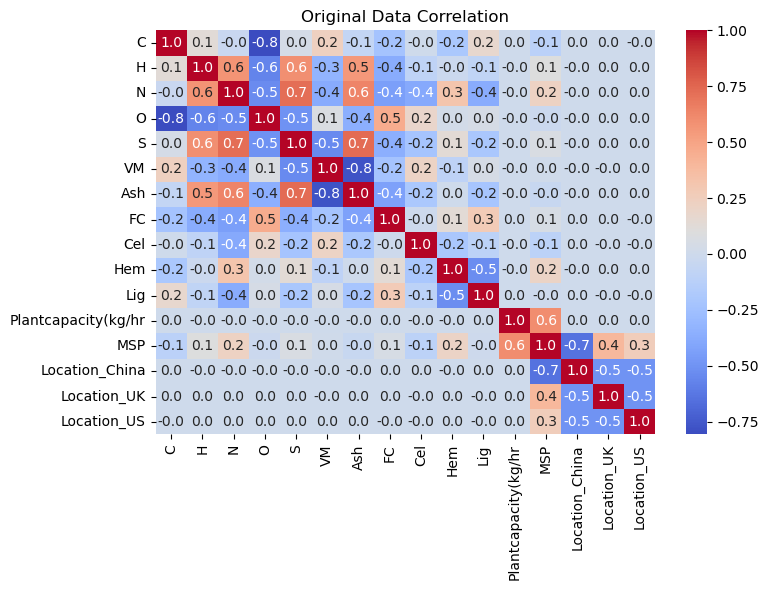

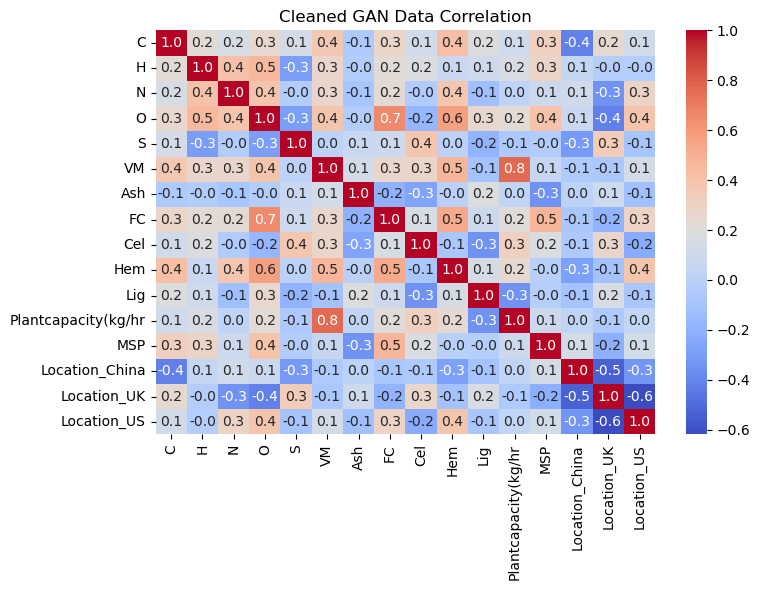

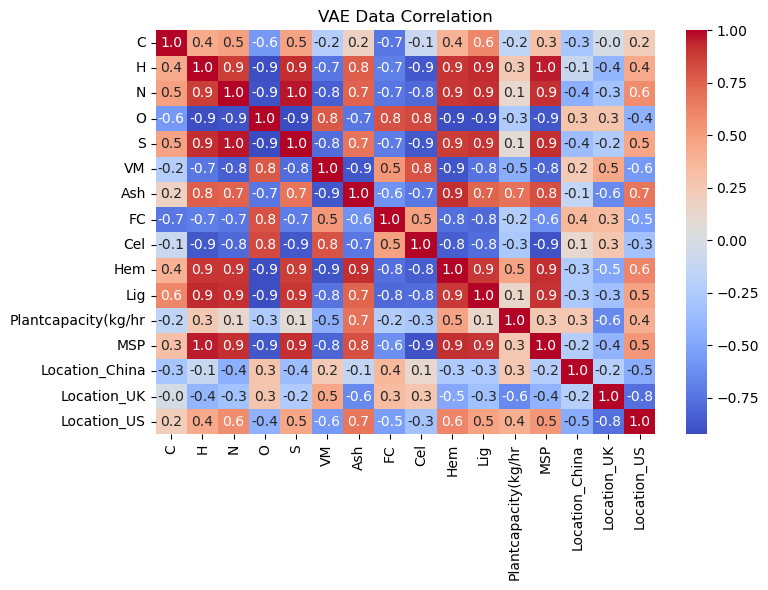

In [14]:
# Calculate correlation matrices after cleaning GAN data
corr_gan_cleaned = gan_df_cleaned.corr()
corr_vae_cleaned = vae_df_cleaned.corr()

# Plot heatmaps for original data
plt.figure(figsize=(8, 6))
sns.heatmap(corr_original, cmap='coolwarm', annot=True, fmt=".1f")
plt.title('Original Data Correlation')
plt.tight_layout()
plt.show()

# Plot heatmaps for cleaned GAN data
plt.figure(figsize=(8, 6))
sns.heatmap(corr_gan_cleaned, cmap='coolwarm', annot=True, fmt=".1f")
plt.title('Cleaned GAN Data Correlation')
plt.tight_layout()
plt.show()

# Plot heatmaps for VAE data
plt.figure(figsize=(8, 6))
sns.heatmap(corr_vae_cleaned, cmap='coolwarm', annot=True, fmt=".1f")
plt.title('VAE Data Correlation')
plt.tight_layout()
plt.show()


Original Dataset Feature Selection

In [17]:
X = original_df.drop(columns=['MSP'])
y = original_df['MSP']

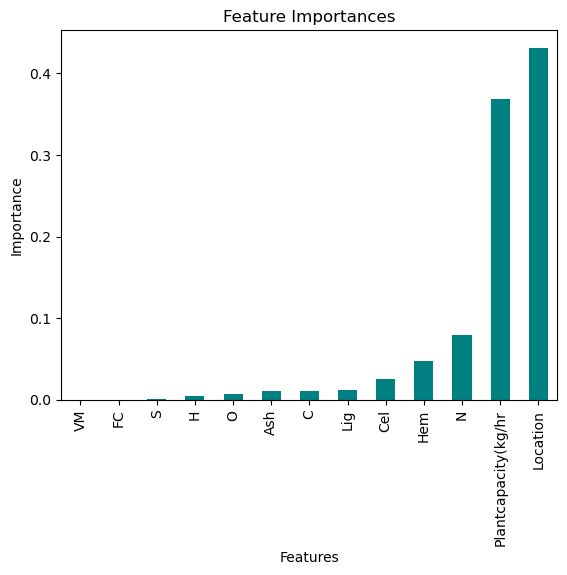

In [21]:
# Initializing the RandomForestRegressor model
model = GradientBoostingRegressor(n_estimators=100, random_state=42)

# Fitting the model
model.fit(X, y)

# Getting feature importances
importances = model.feature_importances_

# Creating a DataFrame to hold feature importances
final_df = pd.DataFrame({"Features": X.columns, "Importances": importances})

# Sorting the DataFrame by importances
final_df = final_df.sort_values('Importances')

# Plotting feature importances
final_df.plot.bar(x='Features', y='Importances', color='teal', legend=None)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()


GAN Feature Selection

In [26]:
X = gan_df_cleaned.drop(columns=['MSP'])
y = gan_df_cleaned['MSP']

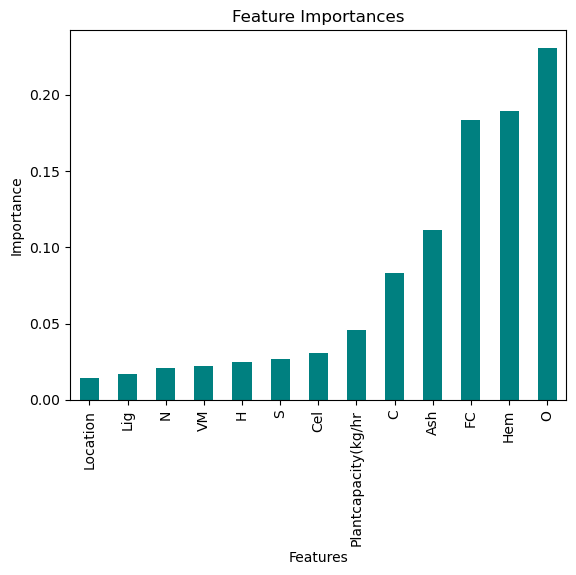

In [27]:
# Initializing the RandomForestRegressor model
model = GradientBoostingRegressor(n_estimators=340, random_state=42)
 
# Fitting the model
model.fit(X, y)

# Getting feature importances
importances = model.feature_importances_

# Creating a DataFrame to hold feature importances
final_df = pd.DataFrame({"Features": X.columns, "Importances": importances})

# Sorting the DataFrame by importances
final_df = final_df.sort_values('Importances')

# Plotting feature importances
final_df.plot.bar(x='Features', y='Importances', color='teal', legend=None)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()


VAE Feature selection

In [28]:
X = vae_df_cleaned.drop(columns=['MSP'])
y = vae_df_cleaned['MSP']

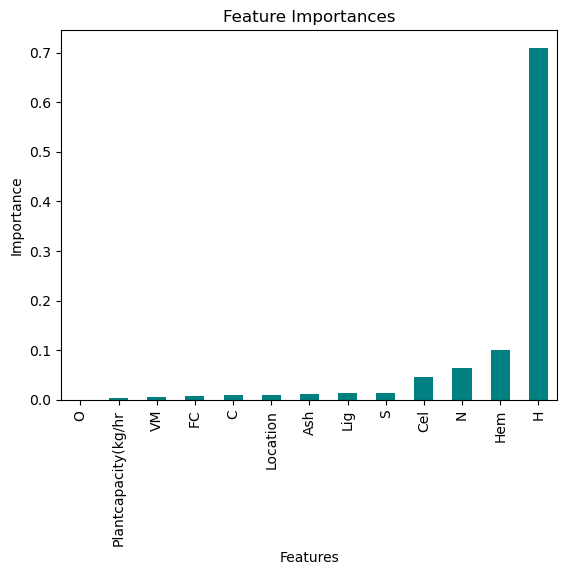

In [29]:
# Initializing the RandomForestRegressor model
model = GradientBoostingRegressor(n_estimators=340, random_state=42)

# Fitting the model
model.fit(X, y)

# Getting feature importances
importances = model.feature_importances_

# Creating a DataFrame to hold feature importances
final_df = pd.DataFrame({"Features": X.columns, "Importances": importances})

# Sorting the DataFrame by importances
final_df = final_df.sort_values('Importances')

# Plotting feature importances
final_df.plot.bar(x='Features', y='Importances', color='teal', legend=None)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()


### Contour plot between 3 variables selected from feature selection

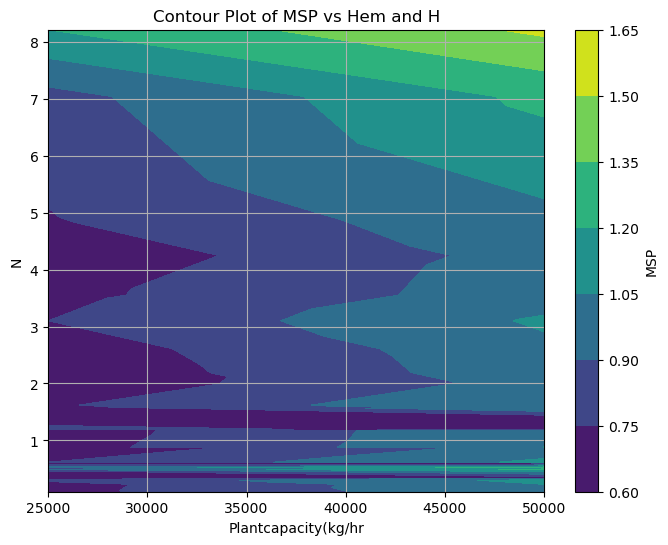

In [21]:
# Extracting x, y, and z data
x = original_df['Plantcapacity(kg/hr']
y = original_df['N']
z = original_df['MSP']

# Create the contour plot
plt.figure(figsize=(8, 6))
contour = plt.tricontourf(x, y, z, cmap='viridis')
plt.colorbar(contour, label='MSP')
plt.title('Contour Plot of MSP vs Hem and H')
plt.xlabel('Plantcapacity(kg/hr')
plt.ylabel('N')
plt.grid(True)
plt.show()


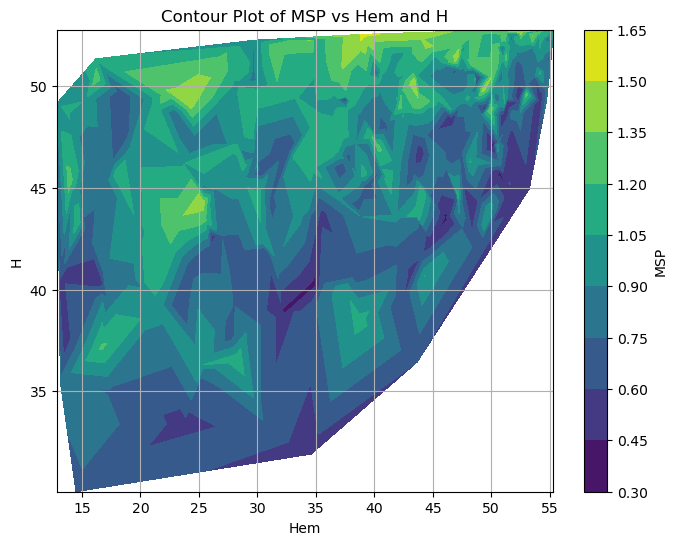

In [22]:
# Extracting x, y, and z data
x = gan_df_cleaned['Hem']
y = gan_df_cleaned['O']
z = gan_df_cleaned['MSP']

# Create the contour plot
plt.figure(figsize=(8, 6))
contour = plt.tricontourf(x, y, z, cmap='viridis')
plt.colorbar(contour, label='MSP')
plt.title('Contour Plot of MSP vs Hem and H')
plt.xlabel('Hem')
plt.ylabel('H')
plt.grid(True)
plt.show()


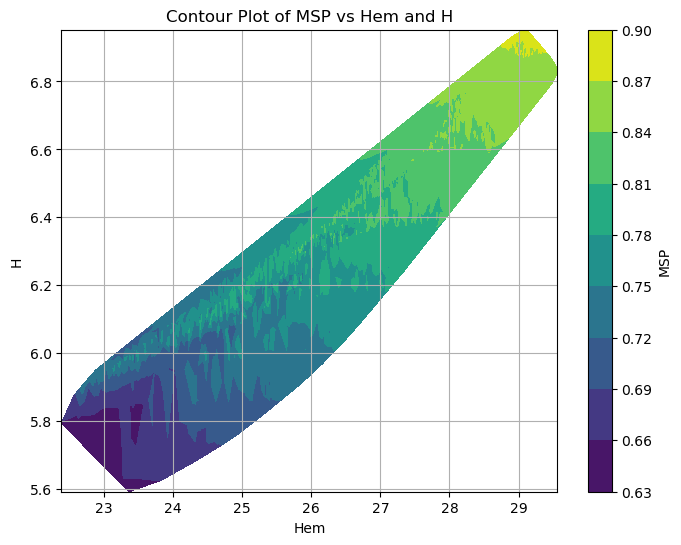

In [23]:
# Extracting x, y, and z data
x = vae_df_cleaned['Hem']
y = vae_df_cleaned['H']
z = vae_df_cleaned['MSP']

# Create the contour plot
plt.figure(figsize=(8, 6))
contour = plt.tricontourf(x, y, z, cmap='viridis')
plt.colorbar(contour, label='MSP')
plt.title('Contour Plot of MSP vs Hem and H')
plt.xlabel('Hem')
plt.ylabel('H')
plt.grid(True)
plt.show()


### Shapley Plot

# # ML Modeling

In [25]:
import numpy as np
import pandas as pd
import shap
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_val_score, KFold, cross_val_predict, GridSearchCV, train_test_split
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import make_scorer, r2_score, mean_squared_error, mean_absolute_error

Modeling On original data

In [26]:
# Splitting the data into features (X) and target variable (y)
X = original_df.drop(columns=['MSP'])
y = original_df['MSP']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Dictionary to store results
results = {}

# Linear Regression
model = LinearRegression()
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
results["Linear Regression"] = {
    "Model": "Linear Regression",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# Random Forest
model = RandomForestRegressor()
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
results["Random Forest"] = {
    "Model": "Random Forest",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# Gradient Boosting
model = GradientBoostingRegressor()
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
results["Gradient Boosting"] = {
    "Model": "Gradient Boosting",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# Elastic Net
model = ElasticNet(alpha=0.1, l1_ratio=0.2, random_state=42)
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
results["Elastic Net"] = {
    "Model": "Elastic Net",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# XGBoost
model = xgb.XGBRegressor(objective='reg:squarederror')
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
results["XGBoost"] = {
    "Model": "XGBoost",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# Display results
results_df = pd.DataFrame(results.values())
# Transpose the DataFrame
results_df_transposed = results_df.set_index('Model').T

# Display the transposed DataFrame
print(results_df_transposed.to_string())

Model       Linear Regression  Random Forest  Gradient Boosting  Elastic Net   XGBoost
Train R²             0.941193       0.978665           0.998954     0.826588  0.999956
Test R²              0.938361       0.918208           0.946308     0.781922  0.957990
Train RMSE           0.056392       0.033966           0.007519     0.096836  0.001539
Test RMSE            0.067545       0.077808           0.063041     0.127049  0.055763
Train MAE            0.041294       0.018363           0.005791     0.075740  0.001197
Test MAE             0.050905       0.049082           0.027674     0.090699  0.031918


In [30]:
import numpy as np
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import cross_val_score, KFold, cross_val_predict, GridSearchCV, train_test_split
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import make_scorer, r2_score, mean_squared_error, mean_absolute_error

X = original_df.drop(columns=['MSP'])
y = original_df['MSP']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the number of folds for k-fold cross-validation
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

def rmse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred, squared=False)

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror')
}

# Define hyperparameter grids for each model
param_grids = {
    "Linear Regression": {},
    "Random Forest": {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10]
    },
    "Gradient Boosting": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    },
    "Elastic Net": {
        'alpha': [0.1, 0.5, 1.0],
        'l1_ratio': [0.1, 0.5, 0.9]
    },
    "XGBoost": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    }
}

scorers = {
    "R²": make_scorer(r2_score),
    "RMSE": make_scorer(rmse, greater_is_better=False),
    "MAE": make_scorer(mean_absolute_error, greater_is_better=False)
}

results = {}
for name, model in models.items():
    # Perform Grid Search for hyperparameter optimization
    param_grid = param_grids[name]
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scorers, refit='RMSE', cv=kf, n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Store grid search results
    results[name] = grid_search.cv_results_

    # Get the best hyperparameters and best score (converted to positive RMSE)
    best_params = grid_search.best_params_
    best_score_rmse = -grid_search.best_score_  # Negate to convert to positive RMSE

    # Update the model with the best hyperparameters
    best_model = grid_search.best_estimator_
    
    # Calculate metrics for training data (no need for cross_val_score since we used refit)
    y_pred_train = best_model.predict(X_train)
    train_r2 = r2_score(y_train, y_pred_train)
    train_rmse = rmse(y_train, y_pred_train)
    train_mae = mean_absolute_error(y_train, y_pred_train)

    # Fit the model on testing data to get test metrics
    y_pred_test = best_model.predict(X_test)
    test_r2 = r2_score(y_test, y_pred_test)
    test_rmse = rmse(y_test, y_pred_test)
    test_mae = mean_absolute_error(y_test, y_pred_test)

    results[name] = {
        "Train R²": train_r2, "Test R²": test_r2,
        "Train RMSE": train_rmse, "Test RMSE": test_rmse,
        "Train MAE": train_mae, "Test MAE": test_mae,
        "Best Hyperparameters": best_params,
        "Best Score RMSE": best_score_rmse
    }

# Display cross-validated metrics
for name, result in results.items():
    print(f"\nResults for {name}:")
    print(pd.DataFrame([result]))
    
# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Save the DataFrame to an Excel file
#results_df.to_excel("original_model_results.xlsx", index=True)


Results for Linear Regression:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0   0.79562  0.729387    0.105128   0.141527   0.095022  0.120621   

  Best Hyperparameters  Best Score RMSE  
0                   {}         0.115726  

Results for Random Forest:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0   0.96934  0.911006    0.040718   0.081161   0.022651  0.048212   

                                Best Hyperparameters  Best Score RMSE  
0  {'max_depth': None, 'min_samples_split': 5, 'n...          0.09006  

Results for Gradient Boosting:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.999785  0.968689    0.003407   0.048141   0.002488   0.02004   

                                Best Hyperparameters  Best Score RMSE  
0  {'learning_rate': 0.1, 'max_depth': 3, 'n_esti...         0.069281  

Results for Elastic Net:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.776073  0.709339   

In [28]:

X = original_df.drop(columns=['MSP'])
y = original_df['MSP']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the number of folds for k-fold cross-validation
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

def rmse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred, squared=False)

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror')
}

# Define hyperparameter grids for each model
param_grids = {
    "Linear Regression": {},
    "Random Forest": {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10]
    },
    "Gradient Boosting": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    },
    "Elastic Net": {
        'alpha': [0.1, 0.5, 1.0],
        'l1_ratio': [0.1, 0.5, 0.9]
    },
    "XGBoost": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    }
}

scorers = {
    "R²": make_scorer(r2_score),
    "RMSE": make_scorer(rmse, greater_is_better=False),
    "MAE": make_scorer(mean_absolute_error, greater_is_better=False)
}

results = {}
for name, model in models.items():
    # Perform Grid Search for hyperparameter optimization
    param_grid = param_grids[name]
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scorers, refit='RMSE', cv=kf, n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Store grid search results
    results[name] = grid_search.cv_results_

    # Get the best hyperparameters and best score (converted to positive RMSE)
    best_params = grid_search.best_params_
    best_score_rmse = -grid_search.best_score_  # Negate to convert to positive RMSE

    # Update the model with the best hyperparameters
    best_model = grid_search.best_estimator_
    
    # Calculate metrics for training data (no need for cross_val_score since we used refit)
    y_pred_train = best_model.predict(X_train)
    train_r2 = r2_score(y_train, y_pred_train)
    train_rmse = rmse(y_train, y_pred_train)
    train_mae = mean_absolute_error(y_train, y_pred_train)

    # Fit the model on testing data to get test metrics
    y_pred_test = best_model.predict(X_test)
    test_r2 = r2_score(y_test, y_pred_test)
    test_rmse = rmse(y_test, y_pred_test)
    test_mae = mean_absolute_error(y_test, y_pred_test)
    
    # Cross-validation scores
    cv_scores = cross_val_score(model, X_train, y_train, cv=kf, scoring=scorers['RMSE'])

    results[name] = {
        "Train R²": train_r2, "Test R²": test_r2,
        "Train RMSE": train_rmse, "Test RMSE": test_rmse,
        "Train MAE": train_mae, "Test MAE": test_mae,
        "Best Hyperparameters": best_params,
        "Best Score RMSE": best_score_rmse,
        "CV Scores": cv_scores
    }

# Display cross-validated metrics
for name, result in results.items():
    print(f"\nResults for {name}:")
    print(pd.DataFrame([result]))
    
# Create a DataFrame from the results
results_df = pd.DataFrame(results).T


Results for Linear Regression:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.941193  0.938361    0.056392   0.067545   0.041294  0.050905   

  Best Hyperparameters  Best Score RMSE  \
0                   {}         0.063104   

                                           CV Scores  
0  [-0.047733258103331073, -0.08327523523759289, ...  

Results for Random Forest:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.975589  0.917674    0.036332   0.078061   0.018741  0.046905   

                                Best Hyperparameters  Best Score RMSE  \
0  {'max_depth': None, 'min_samples_split': 2, 'n...         0.090546   

                                           CV Scores  
0  [-0.047738705171659825, -0.11854917719607624, ...  

Results for Gradient Boosting:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.998954  0.954341    0.007519   0.058134   0.005791  0.026789   

                                Best 

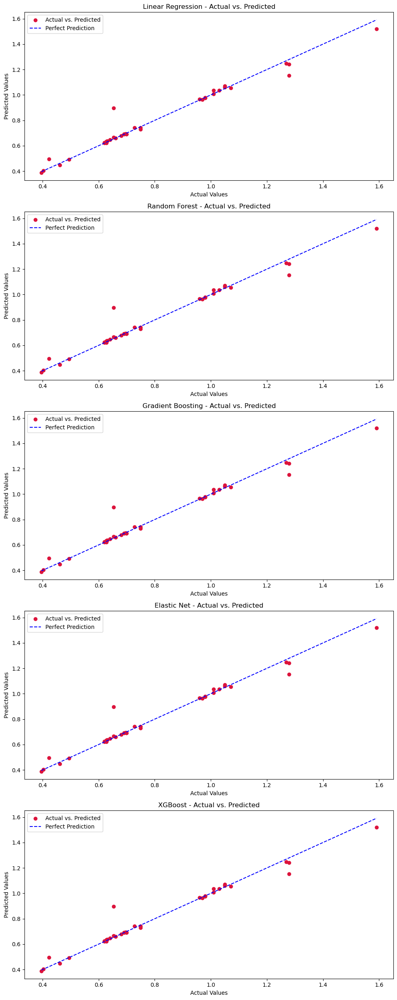

In [29]:
# Define a dictionary to store the actual and predicted values for each model
predicted = {}

# Fit each model and make predictions on the test data
for model_name, model in models.items():
    best_model.fit(X_train, y_train)  # Fit the model with training data
    y_pred = best_model.predict(X_test)  # Make predictions on the test data
    predicted[model_name] = (y_test, y_pred)  # Store actual and predicted values

# Plotting actual vs. predicted values for each model
fig, axes = plt.subplots(len(models), 1, figsize=(10, 5 * len(models)))

for idx, (model_name, (actual, predicted_values)) in enumerate(predicted.items()):
    axes[idx].scatter(actual, predicted_values, c='crimson', label='Actual vs. Predicted')
    axes[idx].plot([actual.min(), actual.max()], [actual.min(), actual.max()], 'b--', label='Perfect Prediction')
    axes[idx].set_title(f'{model_name} - Actual vs. Predicted')
    axes[idx].set_xlabel('Actual Values')
    axes[idx].set_ylabel('Predicted Values')
    axes[idx].legend()

plt.tight_layout()
plt.show()

In [64]:
X = original_df.drop(columns=['MSP'])
y = original_df['MSP']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the number of folds for k-fold cross-validation
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)


def rmse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred, squared=False)
def mae_score(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(max_depth=10, min_samples_split=5, n_estimators=300),
    "Gradient Boosting": GradientBoostingRegressor(learning_rate=0.1, max_depth=3, n_estimators=300),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror', learning_rate=0.5, max_depth=3, n_estimators=100)
}

scorers = {
    "Train R²": make_scorer(r2_score),
    "Test R²": make_scorer(r2_score),
    "Train RMSE": make_scorer(rmse),
    "Test RMSE": make_scorer(rmse),
    "Train MAE": make_scorer(mean_absolute_error),
    "Test MAE": make_scorer(mean_absolute_error)
}

In [65]:
results = {}
predicted = {}
for name, model in models.items():
    # Get cross-validated predictions for plotting actual vs. predicted values
    y_pred = cross_val_predict(model, X, y, cv=kf, n_jobs=-1)
    predicted[name] = (y, y_pred)  # Store actual and predicted values for later plotting

    # Calculate metrics
    r2 = cross_val_score(model, X, y, cv=kf, scoring='r2', n_jobs=-1).mean()
    rmse_val = cross_val_score(model, X, y, cv=kf, scoring=make_scorer(rmse), n_jobs=-1).mean()
    mae_val = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_absolute_error', n_jobs=-1).mean()

    results[name] = {
        "Train R²": r2, "Test R²": r2,
        "Train RMSE": rmse_val, "Test RMSE": rmse_val,
        "Train MAE": -mae_val, "Test MAE": -mae_val
    }

# Display cross-validated metrics
results_df = pd.DataFrame(results).T
print(results_df.to_string())


                   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE
Linear Regression  0.919901  0.919901    0.065419   0.065419   0.048501  0.048501
Random Forest      0.878811  0.878811    0.075440   0.075440   0.047206  0.047206
Gradient Boosting  0.951404  0.951404    0.044585   0.044585   0.022293  0.022293
Elastic Net        0.852988  0.852988    0.090093   0.090093   0.066639  0.066639
XGBoost            0.948543  0.948543    0.051528   0.051528   0.024949  0.024949


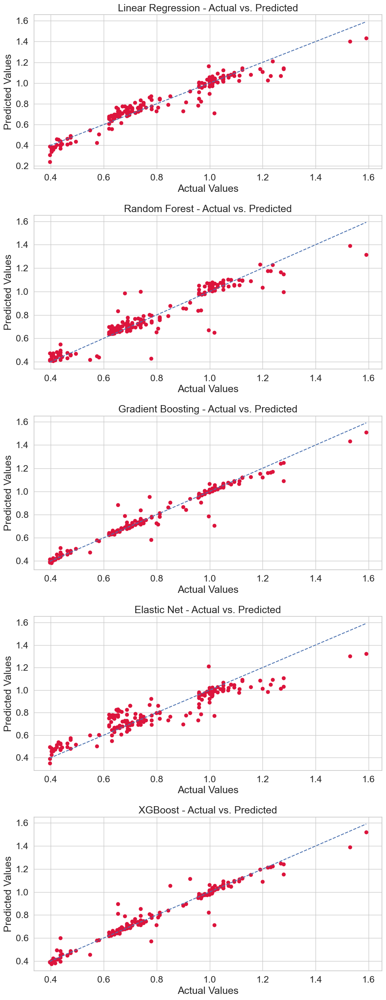

In [66]:
fig, axes = plt.subplots(len(models), 1, figsize=(10, 5 * len(models)))
for idx, (model_name, (actual, predicted)) in enumerate(predicted.items()):
    axes[idx].scatter(actual, predicted, c='crimson')
    axes[idx].plot([actual.min(), actual.max()], [actual.min(), actual.max()], 'b--')
    axes[idx].set_title(f'{model_name} - Actual vs. Predicted')
    axes[idx].set_xlabel('Actual Values')
    axes[idx].set_ylabel('Predicted Values')
plt.tight_layout()
plt.show()

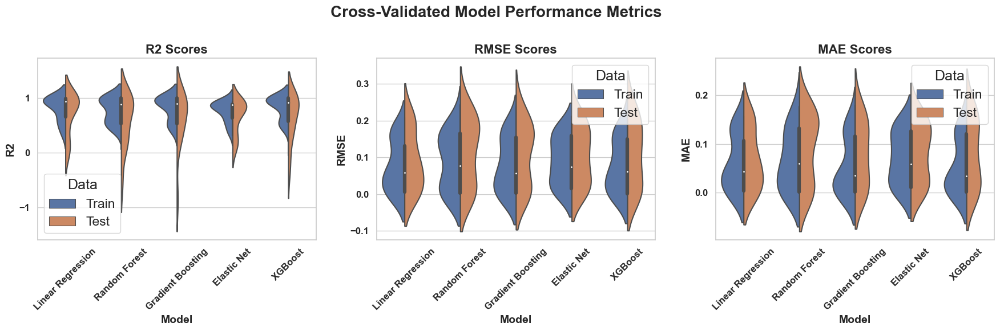

In [67]:
for model_name, model in models.items():
    for score_name, scorer in scoring.items():
        scores_train = cross_val_score(model, X_train, y_train, cv=kf, scoring=scorer)
        scores_test = cross_val_score(model, X_test, y_test, cv=kf, scoring=scorer)
        # Adjust scores based on whether they are typically 'higher is better' or 'lower is better'
        metric_scores.extend([{'Model': model_name, 'Metric': score_name, 'Score': -score if score_name != 'R2' else score, 'Data': 'Train'} for score in scores_train])
        metric_scores.extend([{'Model': model_name, 'Metric': score_name, 'Score': -score if score_name != 'R2' else score, 'Data': 'Test'} for score in scores_test])

# Convert metric scores to DataFrame
score_df = pd.DataFrame(metric_scores)

# Increase font size and weight
sns.set_context("paper", font_scale=1.5)
sns.set(font_scale=1.5, style="whitegrid")

# Plotting the metrics using violin plots
plt.figure(figsize=(18, 6))
plt.suptitle('Cross-Validated Model Performance Metrics', fontsize=20, fontweight='bold')

# Plot for each metric
for i, metric in enumerate(['R2', 'RMSE', 'MAE']):
    plt.subplot(1, 3, i+1)
    sns.violinplot(data=score_df[score_df['Metric'] == metric], x='Model', y='Score', hue='Data', split=True)
    plt.title(f'{metric} Scores', fontsize=16, fontweight='bold')
    plt.ylabel(metric, fontsize=14, fontweight='bold')
    plt.xlabel('Model', fontsize=14, fontweight='bold')
    plt.xticks(rotation=45, fontsize=12, fontweight='bold')
    plt.yticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

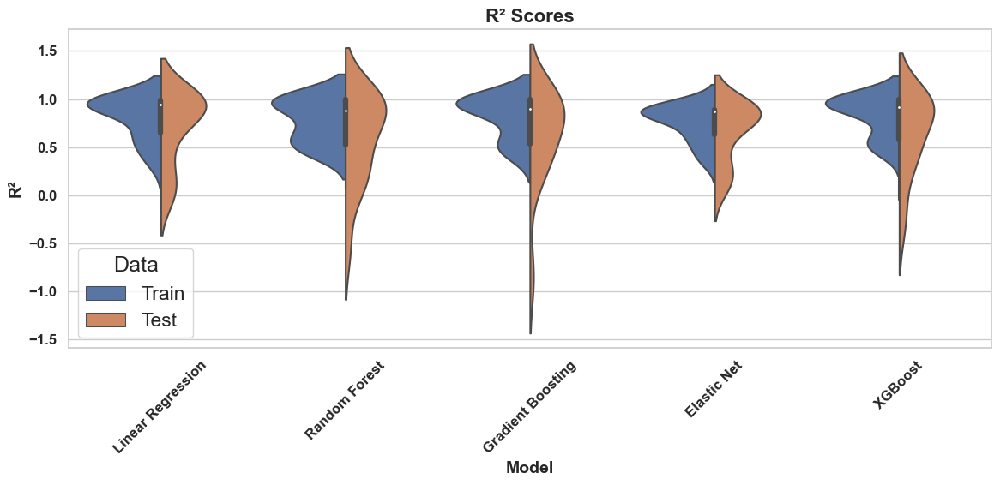

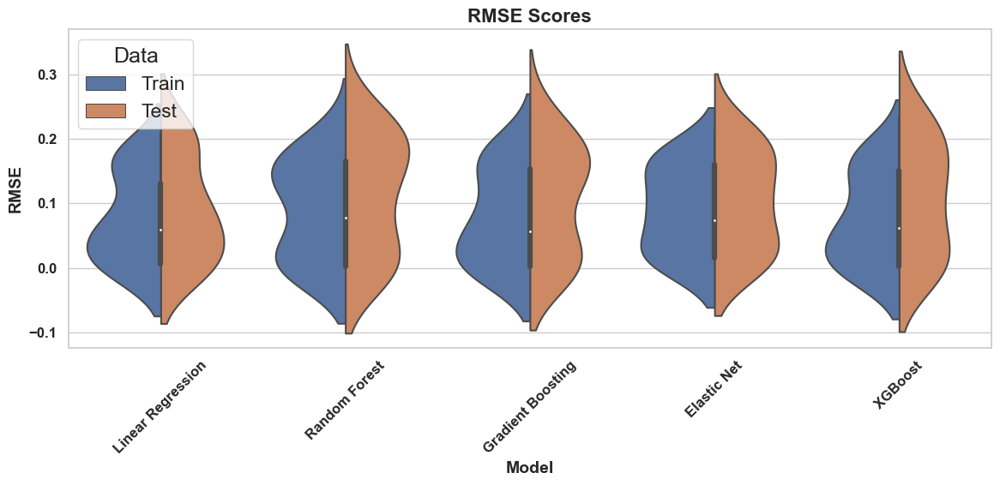

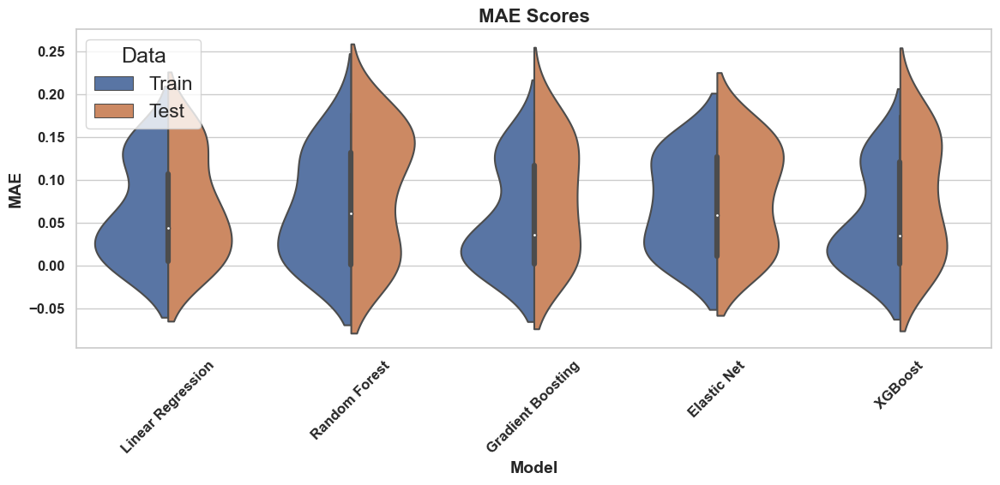

In [68]:
# Increase font size and weight
sns.set_context("paper", font_scale=1.5)
sns.set(font_scale=1.5, style="whitegrid")

# Plotting the R² scores using violin plots
plt.figure(figsize=(12, 6))
sns.violinplot(data=score_df[score_df['Metric'] == 'R2'], x='Model', y='Score', hue='Data', split=True)
plt.title('R² Scores', fontsize=16, fontweight='bold')
plt.ylabel('R²', fontsize=14, fontweight='bold')
plt.xlabel('Model', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

# Plotting the RMSE scores using violin plots
plt.figure(figsize=(12, 6))
sns.violinplot(data=score_df[score_df['Metric'] == 'RMSE'], x='Model', y='Score', hue='Data', split=True)
plt.title('RMSE Scores', fontsize=16, fontweight='bold')
plt.ylabel('RMSE', fontsize=14, fontweight='bold')
plt.xlabel('Model', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

# Plotting the MAE scores using violin plots
plt.figure(figsize=(12, 6))
sns.violinplot(data=score_df[score_df['Metric'] == 'MAE'], x='Model', y='Score', hue='Data', split=True)
plt.title('MAE Scores', fontsize=16, fontweight='bold')
plt.ylabel('MAE', fontsize=14, fontweight='bold')
plt.xlabel('Model', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

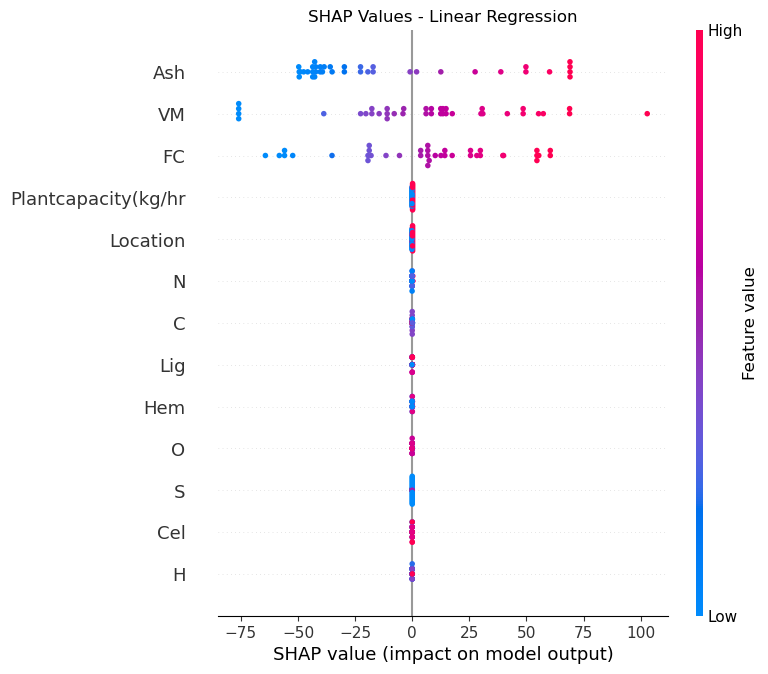

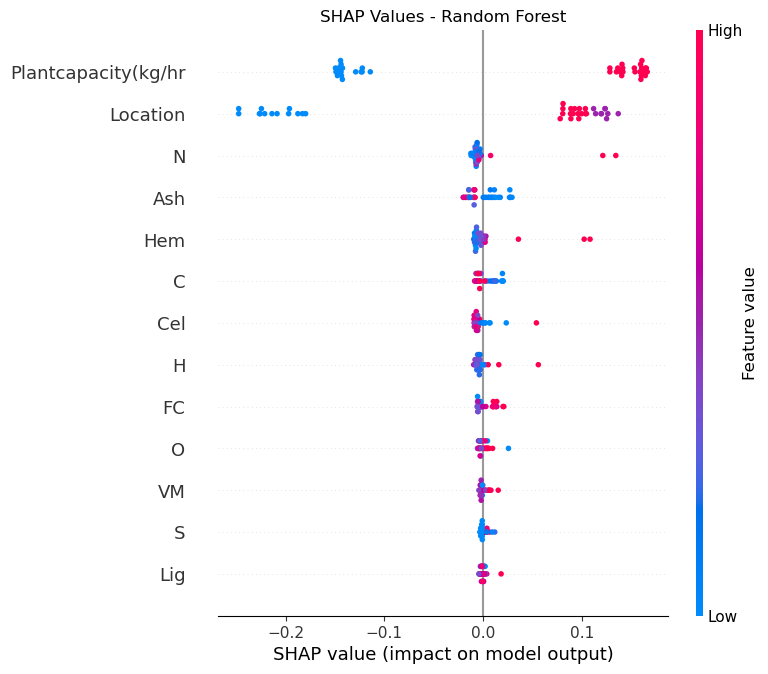

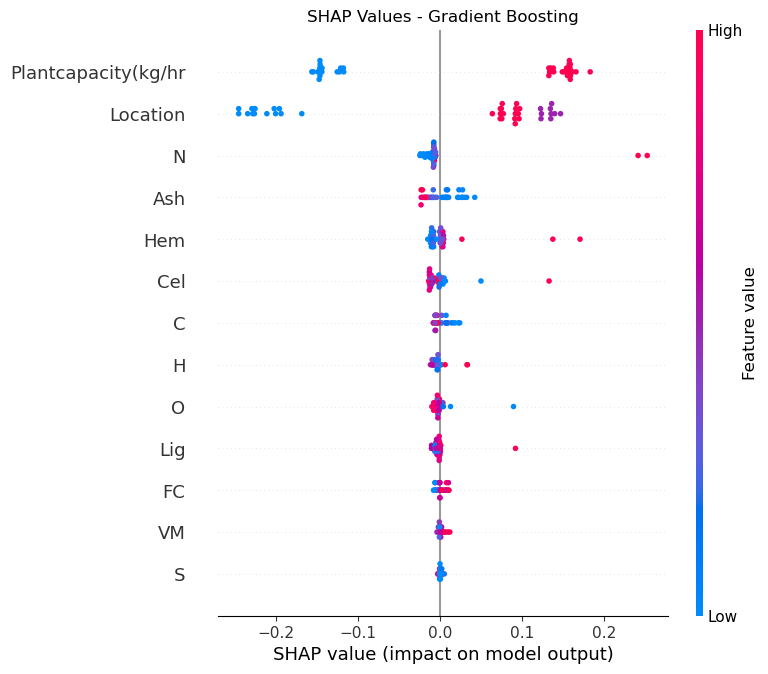

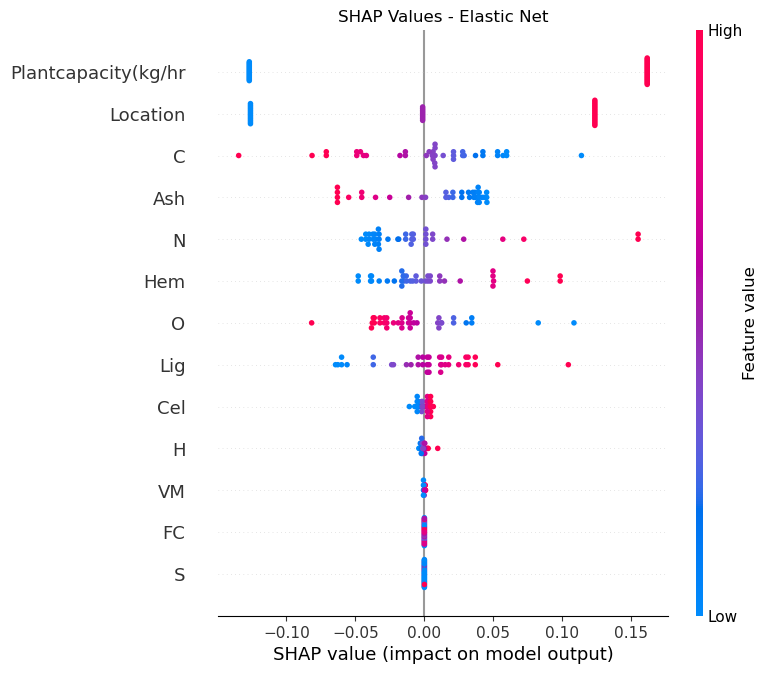

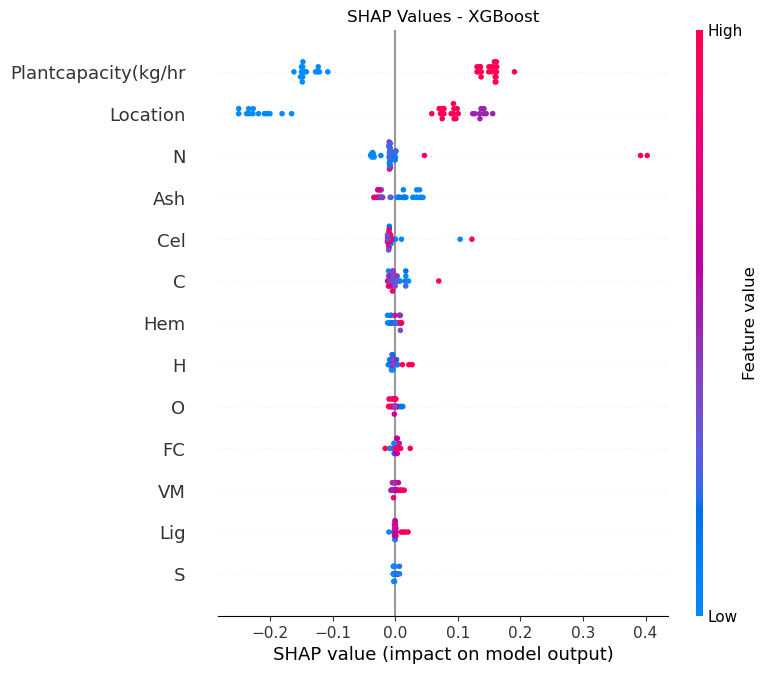

In [31]:
# Instantiate models
linear_reg = LinearRegression()
random_forest = RandomForestRegressor()
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.2, random_state=42)
gradient_boosting = GradientBoostingRegressor()
xgboost = xgb.XGBRegressor(objective='reg:squarederror')

# Dictionary of models
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(max_depth=10, min_samples_split=5, n_estimators=300),
    "Gradient Boosting": GradientBoostingRegressor(learning_rate=0.1, max_depth=3, n_estimators=300),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror', learning_rate=0.5, max_depth=3, n_estimators=100)
}

# Compute SHAP values for each model
shap_values_dict = {}
for model_name, model in models.items():
    # Fit the model
    model.fit(X_train, y_train)
    # Compute SHAP values
    if model_name in ["Random Forest", "Gradient Boosting", "XGBoost"]:
        explainer = shap.TreeExplainer(model)
    elif model_name in ["Linear Regression", "Elastic Net"]:
        explainer = shap.LinearExplainer(model, X_train)
    else:
        raise ValueError(f"Model {model_name} is not supported for SHAP computation.")
    shap_values = explainer.shap_values(X_test)
    shap_values_dict[model_name] = shap_values

# Plot SHAP values
for model_name, shap_values in shap_values_dict.items():
    shap.summary_plot(shap_values, X_test, show=False)
    plt.title(f'SHAP Values - {model_name}')
    plt.show()

## Modeling on GAN data

In [36]:
# Splitting the data into features (X) and target variable (y)
from sklearn.linear_model import ElasticNet
X = gan_df_cleaned.drop(columns=['MSP'])
y = gan_df_cleaned['MSP']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Dictionary to store results
results = {}

# Linear Regression
model = LinearRegression()
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
results["Linear Regression"] = {
    "Model": "Linear Regression",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# Random Forest
model = RandomForestRegressor()
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
results["Random Forest"] = {
    "Model": "Random Forest",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# Gradient Boosting
model = GradientBoostingRegressor()
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
results["Gradient Boosting"] = {
    "Model": "Gradient Boosting",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# Elastic Net
model = ElasticNet(alpha=0.1, l1_ratio=0.2, random_state=42)
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
results["Elastic Net"] = {
    "Model": "Elastic Net",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# XGBoost
xgb_model = xgb.XGBRegressor(objective='reg:squarederror')
xgb_model.fit(X_train, y_train)  # Corrected line: use xgb_model to fit
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)
results["XGBoost"] = {
    "Model": "XGBoost",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# Display results
results_df = pd.DataFrame(results.values())
# Transpose the DataFrame
results_df_transposed = results_df.set_index('Model').T

# Display the transposed DataFrame
print(results_df_transposed.to_string())

Model       Linear Regression  Random Forest  Gradient Boosting  Elastic Net   XGBoost
Train R²             0.607079       0.936957           0.963052     0.573598  0.999989
Test R²              0.415475       0.525702           0.557317     0.430864  0.615200
Train RMSE           0.155423       0.062256           0.047661     0.161910  0.000815
Test RMSE            0.169021       0.152253           0.147091     0.166782  0.137138
Train MAE            0.125148       0.049817           0.038010     0.129032  0.000575
Test MAE             0.132912       0.124576           0.117258     0.129805  0.112115


In [34]:
X = gan_df_cleaned.drop(columns=['MSP'])
y = gan_df_cleaned['MSP']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the number of folds for k-fold cross-validation
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

def rmse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred, squared=False)

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror')
}

# Define hyperparameter grids for each model
param_grids = {
    "Linear Regression": {},
    "Random Forest": {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10]
    },
    "Gradient Boosting": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    },
    "Elastic Net": {
        'alpha': [0.1, 0.5, 1.0],
        'l1_ratio': [0.1, 0.5, 0.9]
    },
    "XGBoost": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    }
}

scorers = {
    "R²": make_scorer(r2_score),
    "RMSE": make_scorer(rmse, greater_is_better=False),
    "MAE": make_scorer(mean_absolute_error, greater_is_better=False)
}

results = {}
for name, model in models.items():
    # Perform Grid Search for hyperparameter optimization
    param_grid = param_grids[name]
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scorers, refit='RMSE', cv=kf, n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Store grid search results
    results[name] = grid_search.cv_results_

    # Get the best hyperparameters and best score (converted to positive RMSE)
    best_params = grid_search.best_params_
    best_score_rmse = -grid_search.best_score_  # Negate to convert to positive RMSE

    # Update the model with the best hyperparameters
    best_model = grid_search.best_estimator_
    
    # Calculate metrics for training data (no need for cross_val_score since we used refit)
    y_pred_train = best_model.predict(X_train)
    train_r2 = r2_score(y_train, y_pred_train)
    train_rmse = rmse(y_train, y_pred_train)
    train_mae = mean_absolute_error(y_train, y_pred_train)

    # Fit the model on testing data to get test metrics
    y_pred_test = best_model.predict(X_test)
    test_r2 = r2_score(y_test, y_pred_test)
    test_rmse = rmse(y_test, y_pred_test)
    test_mae = mean_absolute_error(y_test, y_pred_test)

    results[name] = {
        "Train R²": train_r2, "Test R²": test_r2,
        "Train RMSE": train_rmse, "Test RMSE": test_rmse,
        "Train MAE": train_mae, "Test MAE": test_mae,
        "Best Hyperparameters": best_params,
        "Best Score RMSE": best_score_rmse
    }

# Display cross-validated metrics
for name, result in results.items():
    print(f"\nResults for {name}:")
    print(pd.DataFrame([result]))
    
# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Save the DataFrame to an Excel file
#results_df.to_excel("GAN_model_results.xlsx", index=True)


Results for Linear Regression:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.592191  0.381783    0.158341   0.173824   0.126262  0.136569   

  Best Hyperparameters  Best Score RMSE  
0                   {}         0.167503  

Results for Random Forest:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.934168  0.519094    0.063618    0.15331   0.050674  0.125179   

                                Best Hyperparameters  Best Score RMSE  
0  {'max_depth': 10, 'min_samples_split': 2, 'n_e...         0.170853  

Results for Gradient Boosting:
   Train R²  Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.998043   0.5829    0.010969   0.142778   0.008786  0.114679   

                                Best Hyperparameters  Best Score RMSE  
0  {'learning_rate': 0.1, 'max_depth': 3, 'n_esti...         0.167161  

Results for Elastic Net:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.581691  0.425207    0

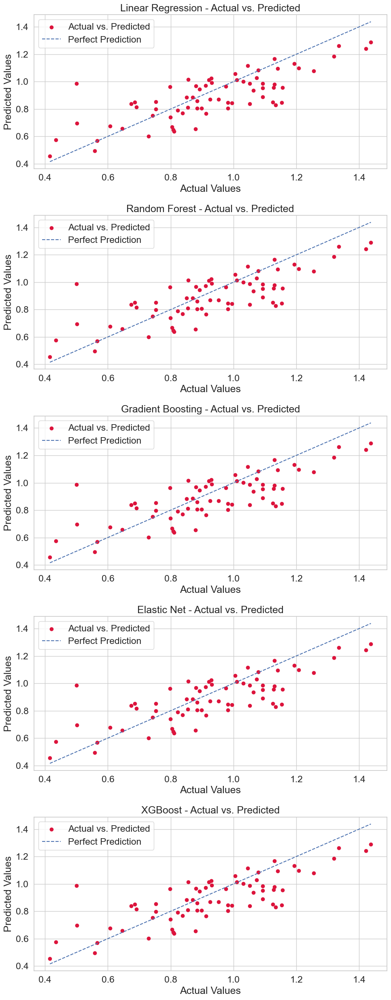

In [38]:
# Define a dictionary to store the actual and predicted values for each model
predicted = {}

# Fit each model and make predictions on the test data
for model_name, model in models.items():
    best_model.fit(X_train, y_train)  # Fit the model with training data
    y_pred = best_model.predict(X_test)  # Make predictions on the test data
    predicted[model_name] = (y_test, y_pred)  # Store actual and predicted values

# Plotting actual vs. predicted values for each model
fig, axes = plt.subplots(len(models), 1, figsize=(10, 5 * len(models)))

for idx, (model_name, (actual, predicted_values)) in enumerate(predicted.items()):
    axes[idx].scatter(actual, predicted_values, c='crimson', label='Actual vs. Predicted')
    axes[idx].plot([actual.min(), actual.max()], [actual.min(), actual.max()], 'b--', label='Perfect Prediction')
    axes[idx].set_title(f'{model_name} - Actual vs. Predicted')
    axes[idx].set_xlabel('Actual Values')
    axes[idx].set_ylabel('Predicted Values')
    axes[idx].legend()

plt.tight_layout()
plt.show()


In [57]:
X = gan_df_cleaned.drop(columns=['MSP'])
y = gan_df_cleaned['MSP']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Define the number of folds for k-fold cross-validation
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)


def rmse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred, squared=False)
def mae_score(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(max_depth=10, min_samples_split=2, n_estimators=300),
    "Gradient Boosting": GradientBoostingRegressor(learning_rate=0.1, max_depth=3, n_estimators=200),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror', learning_rate=0.1, max_depth=3, n_estimators=300)
}

scorers = {
    "Train R²": make_scorer(r2_score),
    "Test R²": make_scorer(r2_score),
    "Train RMSE": make_scorer(rmse),
    "Test RMSE": make_scorer(rmse),
    "Train MAE": make_scorer(mean_absolute_error),
    "Test MAE": make_scorer(mean_absolute_error)
}


In [58]:
results = {}
predicted = {}
for name, model in models.items():
    # Get cross-validated predictions for plotting actual vs. predicted values
    y_pred = cross_val_predict(model, X, y, cv=kf, n_jobs=-1)
    predicted[name] = (y, y_pred)  # Store actual and predicted values for later plotting

    # Calculate metrics
    r2 = cross_val_score(model, X, y, cv=kf, scoring='r2', n_jobs=-1).mean()
    rmse_val = cross_val_score(model, X, y, cv=kf, scoring=make_scorer(rmse), n_jobs=-1).mean()
    mae_val = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_absolute_error', n_jobs=-1).mean()

    results[name] = {
        "Train R²": r2, "Test R²": r2,
        "Train RMSE": rmse_val, "Test RMSE": rmse_val,
        "Train MAE": -mae_val, "Test MAE": -mae_val
    }

# Display cross-validated metrics
results_df = pd.DataFrame(results).T
print(results_df.to_string())


                   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE
Linear Regression  0.516673  0.516673    0.165624   0.165624   0.132761  0.132761
Random Forest      0.522355  0.522355    0.165399   0.165399   0.134539  0.134539
Gradient Boosting  0.556419  0.556419    0.159693   0.159693   0.126300  0.126300
Elastic Net        0.505384  0.505384    0.167412   0.167412   0.132691  0.132691
XGBoost            0.573795  0.573795    0.156443   0.156443   0.124386  0.124386


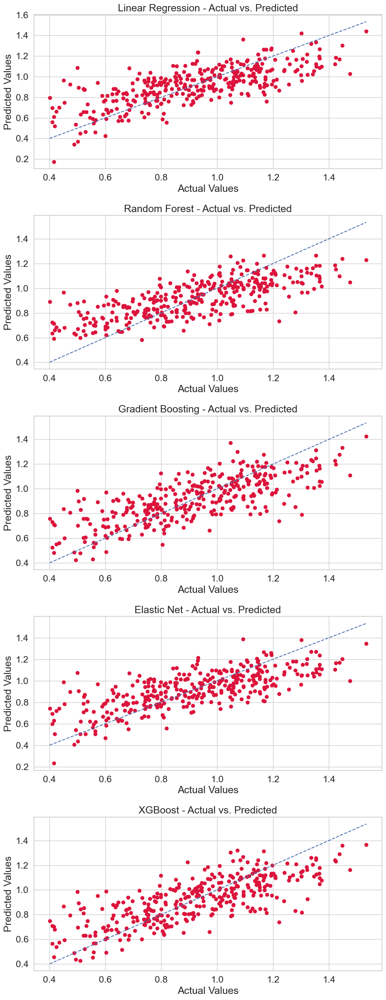

In [59]:
fig, axes = plt.subplots(len(models), 1, figsize=(10, 5 * len(models)))
for idx, (model_name, (actual, predicted)) in enumerate(predicted.items()):
    axes[idx].scatter(actual, predicted, c='crimson')
    axes[idx].plot([actual.min(), actual.max()], [actual.min(), actual.max()], 'b--')
    axes[idx].set_title(f'{model_name} - Actual vs. Predicted')
    axes[idx].set_xlabel('Actual Values')
    axes[idx].set_ylabel('Predicted Values')
plt.tight_layout()
plt.show()

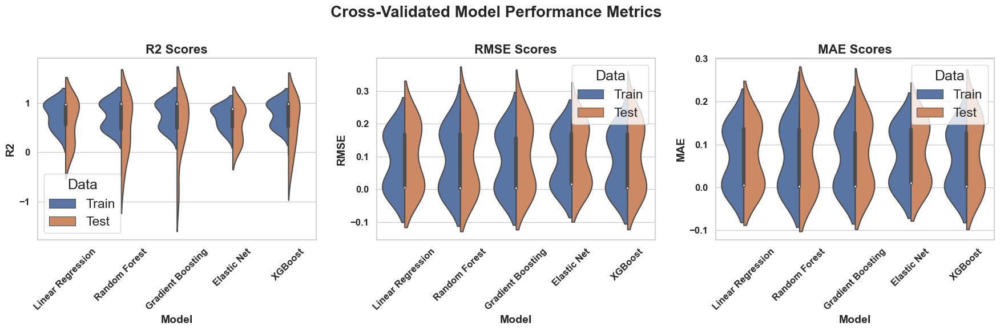

In [60]:
for model_name, model in models.items():
    for score_name, scorer in scoring.items():
        scores_train = cross_val_score(model, X_train, y_train, cv=kf, scoring=scorer)
        scores_test = cross_val_score(model, X_test, y_test, cv=kf, scoring=scorer)
        # Adjust scores based on whether they are typically 'higher is better' or 'lower is better'
        metric_scores.extend([{'Model': model_name, 'Metric': score_name, 'Score': -score if score_name != 'R2' else score, 'Data': 'Train'} for score in scores_train])
        metric_scores.extend([{'Model': model_name, 'Metric': score_name, 'Score': -score if score_name != 'R2' else score, 'Data': 'Test'} for score in scores_test])

# Convert metric scores to DataFrame
score_df = pd.DataFrame(metric_scores)

# Increase font size and weight
sns.set_context("paper", font_scale=1.5)
sns.set(font_scale=1.5, style="whitegrid")

# Plotting the metrics using violin plots
plt.figure(figsize=(18, 6))
plt.suptitle('Cross-Validated Model Performance Metrics', fontsize=20, fontweight='bold')

# Plot for each metric
for i, metric in enumerate(['R2', 'RMSE', 'MAE']):
    plt.subplot(1, 3, i+1)
    sns.violinplot(data=score_df[score_df['Metric'] == metric], x='Model', y='Score', hue='Data', split=True)
    plt.title(f'{metric} Scores', fontsize=16, fontweight='bold')
    plt.ylabel(metric, fontsize=14, fontweight='bold')
    plt.xlabel('Model', fontsize=14, fontweight='bold')
    plt.xticks(rotation=45, fontsize=12, fontweight='bold')
    plt.yticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

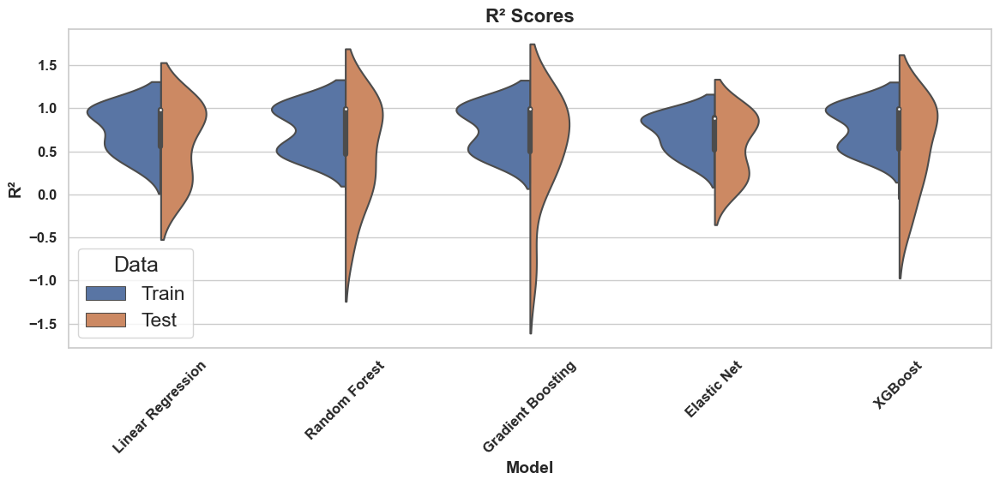

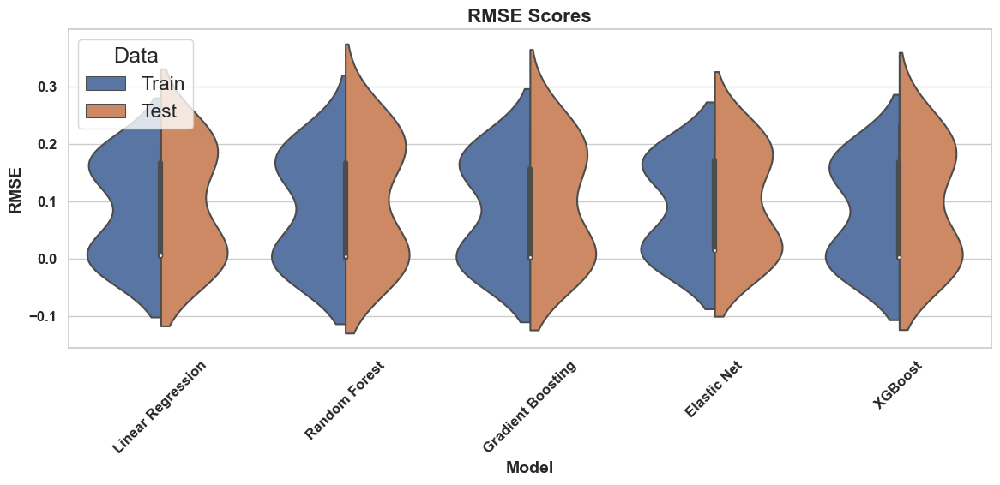

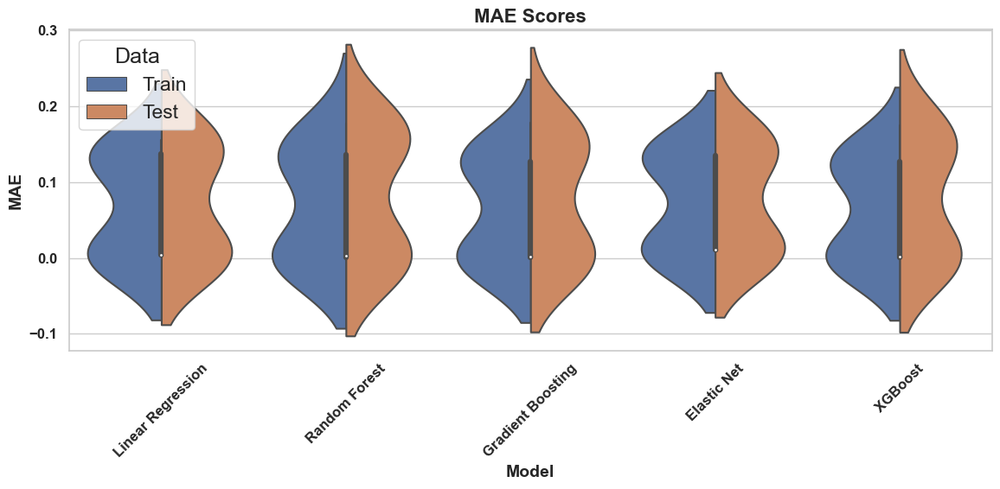

In [61]:
# Increase font size and weight
sns.set_context("paper", font_scale=1.5)
sns.set(font_scale=1.5, style="whitegrid")

# Plotting the R² scores using violin plots
plt.figure(figsize=(12, 6))
sns.violinplot(data=score_df[score_df['Metric'] == 'R2'], x='Model', y='Score', hue='Data', split=True)
plt.title('R² Scores', fontsize=16, fontweight='bold')
plt.ylabel('R²', fontsize=14, fontweight='bold')
plt.xlabel('Model', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

# Plotting the RMSE scores using violin plots
plt.figure(figsize=(12, 6))
sns.violinplot(data=score_df[score_df['Metric'] == 'RMSE'], x='Model', y='Score', hue='Data', split=True)
plt.title('RMSE Scores', fontsize=16, fontweight='bold')
plt.ylabel('RMSE', fontsize=14, fontweight='bold')
plt.xlabel('Model', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

# Plotting the MAE scores using violin plots
plt.figure(figsize=(12, 6))
sns.violinplot(data=score_df[score_df['Metric'] == 'MAE'], x='Model', y='Score', hue='Data', split=True)
plt.title('MAE Scores', fontsize=16, fontweight='bold')
plt.ylabel('MAE', fontsize=14, fontweight='bold')
plt.xlabel('Model', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

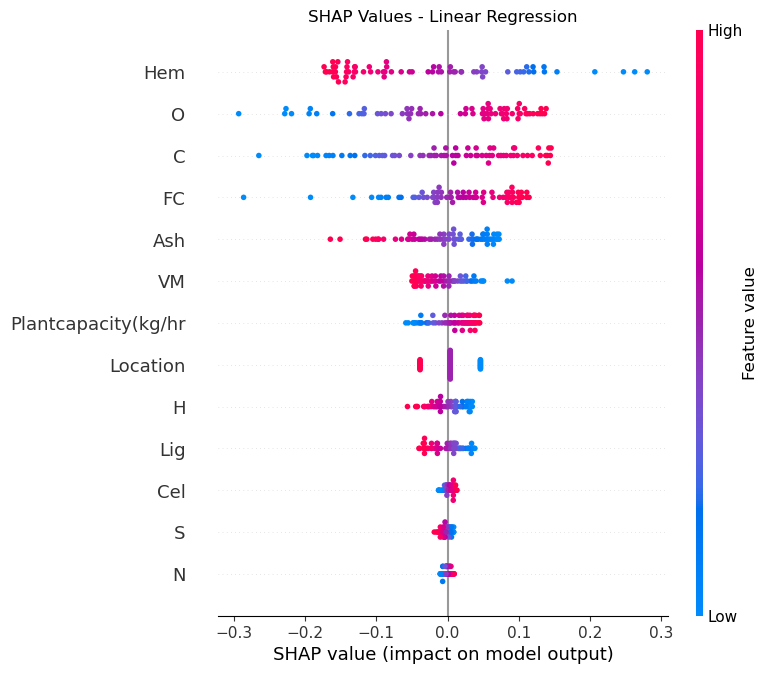

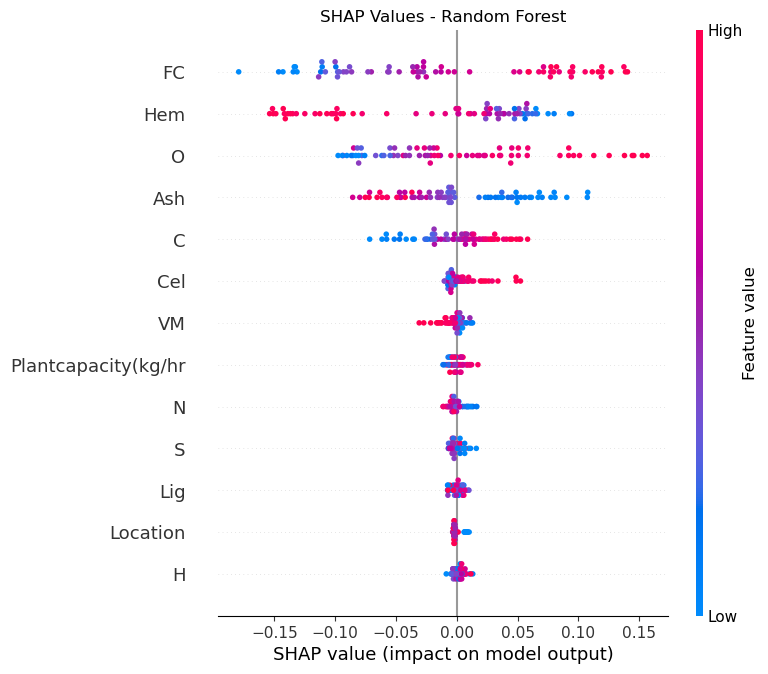

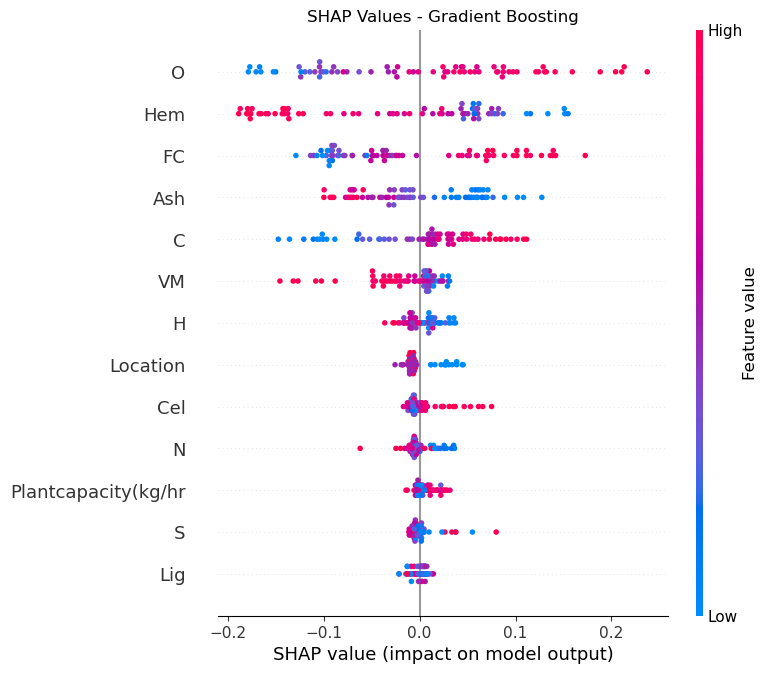

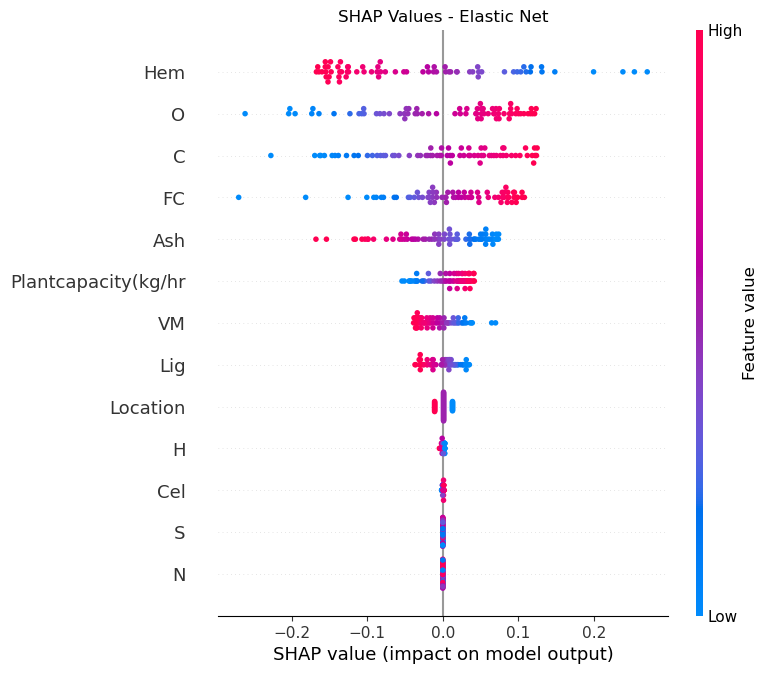

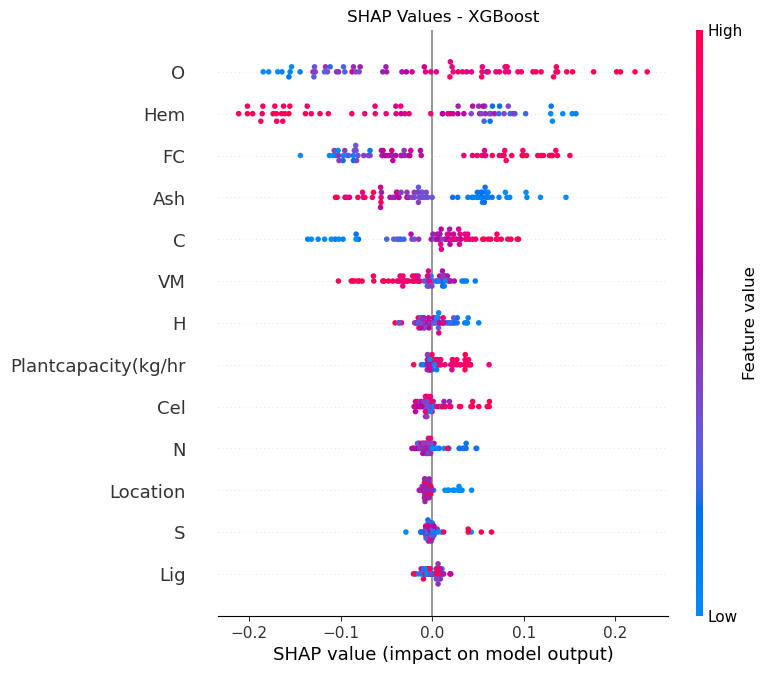

In [35]:
# Dictionary of models
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(max_depth=10, min_samples_split=2, n_estimators=300),
    "Gradient Boosting": GradientBoostingRegressor(learning_rate=0.1, max_depth=3, n_estimators=200),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror', learning_rate=0.1, max_depth=3, n_estimators=300)
}

# Compute SHAP values for each model
shap_values_dict = {}
for model_name, model in models.items():
    # Fit the model
    model.fit(X_train, y_train)
    # Compute SHAP values
    if model_name in ["Random Forest", "Gradient Boosting", "XGBoost"]:
        explainer = shap.TreeExplainer(model)
    elif model_name in ["Linear Regression", "Elastic Net"]:
        explainer = shap.LinearExplainer(model, X_train)
    else:
        raise ValueError(f"Model {model_name} is not supported for SHAP computation.")
    shap_values = explainer.shap_values(X_test)
    shap_values_dict[model_name] = shap_values

# Plot SHAP values
for model_name, shap_values in shap_values_dict.items():
    shap.summary_plot(shap_values, X_test, show=False)
    plt.title(f'SHAP Values - {model_name}')
    plt.show()


## Modelling on VAE Data

In [44]:
# Splitting the data into features (X) and target variable (y)
from sklearn.linear_model import ElasticNet
X = vae_df_cleaned.drop(columns=['MSP'])
y = vae_df_cleaned['MSP']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Dictionary to store results
results = {}

# Linear Regression
model = LinearRegression()
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
results["Linear Regression"] = {
    "Model": "Linear Regression",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# Random Forest
model = RandomForestRegressor()
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
results["Random Forest"] = {
    "Model": "Random Forest",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# Gradient Boosting
model = GradientBoostingRegressor()
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
results["Gradient Boosting"] = {
    "Model": "Gradient Boosting",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# Elastic Net
model = ElasticNet(alpha=0.1, l1_ratio=0.2, random_state=42)
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
results["Elastic Net"] = {
    "Model": "Elastic Net",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# XGBoost
xgb_model = xgb.XGBRegressor(objective='reg:squarederror')
xgb_model.fit(X_train, y_train)  # Corrected line: use xgb_model to fit
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)
results["XGBoost"] = {
    "Model": "XGBoost",
    "Train R²": r2_score(y_train, y_pred_train),
    "Test R²": r2_score(y_test, y_pred_test),
    "Train RMSE": mean_squared_error(y_train, y_pred_train, squared=False),
    "Test RMSE": mean_squared_error(y_test, y_pred_test, squared=False),
    "Train MAE": mean_absolute_error(y_train, y_pred_train),
    "Test MAE": mean_absolute_error(y_test, y_pred_test)
}

# Display results
results_df = pd.DataFrame(results.values())
# Transpose the DataFrame
results_df_transposed = results_df.set_index('Model').T

# Display the transposed DataFrame
print(results_df_transposed.to_string())

Model       Linear Regression  Random Forest  Gradient Boosting  Elastic Net   XGBoost
Train R²             0.985160       0.999804           0.996494     0.810704  0.999629
Test R²              0.984681       0.997722           0.994082     0.816899  0.996672
Train RMSE           0.005547       0.000637           0.002696     0.019812  0.000877
Test RMSE            0.005616       0.002166           0.003491     0.019418  0.002618
Train MAE            0.004364       0.000337           0.002041     0.014918  0.000660
Test MAE             0.004472       0.000963           0.002531     0.014735  0.001519


In [32]:
X = vae_df_cleaned.drop(columns=['MSP'])
y = vae_df_cleaned['MSP']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the number of folds for k-fold cross-validation
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

def rmse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred, squared=False)

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror')
}

# Define hyperparameter grids for each model
param_grids = {
    "Linear Regression": {},
    "Random Forest": {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10]
    },
    "Gradient Boosting": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    },
    "Elastic Net": {
        'alpha': [0.1, 0.5, 1.0],
        'l1_ratio': [0.1, 0.5, 0.9]
    },
    "XGBoost": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    }
}

scorers = {
    "R²": make_scorer(r2_score),
    "RMSE": make_scorer(rmse, greater_is_better=False),
    "MAE": make_scorer(mean_absolute_error, greater_is_better=False)
}

results = {}
for name, model in models.items():
    # Perform Grid Search for hyperparameter optimization
    param_grid = param_grids[name]
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scorers, refit='RMSE', cv=kf, n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Store grid search results
    results[name] = grid_search.cv_results_

    # Get the best hyperparameters and best score (converted to positive RMSE)
    best_params = grid_search.best_params_
    best_score_rmse = -grid_search.best_score_  # Negate to convert to positive RMSE

    # Update the model with the best hyperparameters
    best_model = grid_search.best_estimator_
    
    # Calculate metrics for training data (no need for cross_val_score since we used refit)
    y_pred_train = best_model.predict(X_train)
    train_r2 = r2_score(y_train, y_pred_train)
    train_rmse = rmse(y_train, y_pred_train)
    train_mae = mean_absolute_error(y_train, y_pred_train)

    # Fit the model on testing data to get test metrics
    y_pred_test = best_model.predict(X_test)
    test_r2 = r2_score(y_test, y_pred_test)
    test_rmse = rmse(y_test, y_pred_test)
    test_mae = mean_absolute_error(y_test, y_pred_test)

    results[name] = {
        "Train R²": train_r2, "Test R²": test_r2,
        "Train RMSE": train_rmse, "Test RMSE": test_rmse,
        "Train MAE": train_mae, "Test MAE": test_mae,
        "Best Hyperparameters": best_params,
        "Best Score RMSE": best_score_rmse
    }

# Display cross-validated metrics
for name, result in results.items():
    print(f"\nResults for {name}:")
    print(pd.DataFrame([result]))
# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Save the DataFrame to an Excel file
#results_df.to_excel("VAE_model_results.xlsx", index=True)


Results for Linear Regression:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.985158  0.984668    0.005547   0.005619   0.004364  0.004476   

  Best Hyperparameters  Best Score RMSE  
0                   {}         0.005582  

Results for Random Forest:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.999827  0.997803      0.0006   0.002127   0.000318  0.000925   

                                Best Hyperparameters  Best Score RMSE  
0  {'max_depth': None, 'min_samples_split': 2, 'n...         0.001852  

Results for Gradient Boosting:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.999972  0.997581     0.00024   0.002232   0.000189  0.001079   

                                Best Hyperparameters  Best Score RMSE  
0  {'learning_rate': 0.1, 'max_depth': 7, 'n_esti...         0.001767  

Results for Elastic Net:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.889956  0.893522   

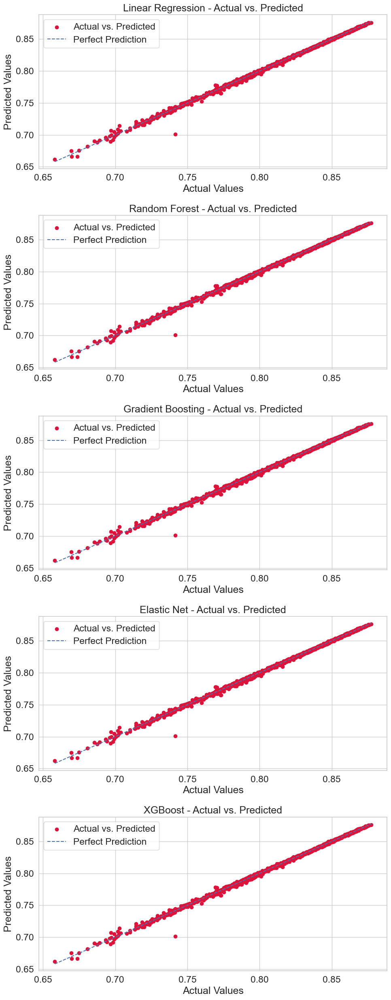

In [46]:
# Define a dictionary to store the actual and predicted values for each model
predicted = {}

# Fit each model and make predictions on the test data
for model_name, model in models.items():
    best_model.fit(X_train, y_train)  # Fit the model with training data
    y_pred = best_model.predict(X_test)  # Make predictions on the test data
    predicted[model_name] = (y_test, y_pred)  # Store actual and predicted values

# Plotting actual vs. predicted values for each model
fig, axes = plt.subplots(len(models), 1, figsize=(10, 5 * len(models)))

for idx, (model_name, (actual, predicted_values)) in enumerate(predicted.items()):
    axes[idx].scatter(actual, predicted_values, c='crimson', label='Actual vs. Predicted')
    axes[idx].plot([actual.min(), actual.max()], [actual.min(), actual.max()], 'b--', label='Perfect Prediction')
    axes[idx].set_title(f'{model_name} - Actual vs. Predicted')
    axes[idx].set_xlabel('Actual Values')
    axes[idx].set_ylabel('Predicted Values')
    axes[idx].legend()

plt.tight_layout()
plt.show()


In [47]:
X = vae_df_cleaned.drop(columns=['MSP'])
y = vae_df_cleaned['MSP']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Define the number of folds for k-fold cross-validation
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)


In [48]:
def rmse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred, squared=False)
def mae_score(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(max_depth=None, min_samples_split=2, n_estimators=200),
    "Gradient Boosting": GradientBoostingRegressor(learning_rate=0.1, max_depth=7, n_estimators=300),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror', learning_rate=0.1, max_depth=7, n_estimators=100)
}

scorers = {
    "Train R²": make_scorer(r2_score),
    "Test R²": make_scorer(r2_score),
    "Train RMSE": make_scorer(rmse),
    "Test RMSE": make_scorer(rmse),
    "Train MAE": make_scorer(mean_absolute_error),
    "Test MAE": make_scorer(mean_absolute_error)
}


In [49]:
results = {}
predicted = {}
for name, model in models.items():
    # Get cross-validated predictions for plotting actual vs. predicted values
    y_pred = cross_val_predict(model, X, y, cv=kf, n_jobs=-1)
    predicted[name] = (y, y_pred)  # Store actual and predicted values for later plotting

    # Calculate metrics
    train_r2 = cross_val_score(model, X, y, cv=kf, scoring='r2', n_jobs=-1).mean()
    test_r2 = cross_val_score(model, X, y, cv=kf, scoring='r2', n_jobs=-1).mean()
    train_rmse = cross_val_score(model, X, y, cv=kf, scoring=make_scorer(rmse), n_jobs=-1).mean()
    test_rmse = cross_val_score(model, X, y, cv=kf, scoring=make_scorer(rmse), n_jobs=-1).mean()
    train_mae = -cross_val_score(model, X, y, cv=kf, scoring='neg_mean_absolute_error', n_jobs=-1).mean()
    test_mae = -cross_val_score(model, X, y, cv=kf, scoring='neg_mean_absolute_error', n_jobs=-1).mean()

    results[name] = {
        "Train R²": train_r2, "Test R²": test_r2,
        "Train RMSE": train_rmse, "Test RMSE": test_rmse,
        "Train MAE": train_mae, "Test MAE": test_mae
    }

# Display cross-validated metrics
results_df = pd.DataFrame(results).T
print(results_df.to_string())

                   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE
Linear Regression  0.984983  0.984983    0.005573   0.005573   0.004386  0.004386
Random Forest      0.998474  0.998461    0.001747   0.001743   0.000869  0.000876
Gradient Boosting  0.998585  0.998598    0.001695   0.001691   0.000962  0.000963
Elastic Net        0.889291  0.889291    0.015126   0.015126   0.010537  0.010537
XGBoost            0.998524  0.998524    0.001732   0.001732   0.001030  0.001030


Testing with Original Data

In [50]:
import joblib

# Get the best performing model object
best_model = models['XGBoost']

best_model.fit(X, y)

# Save the best performing model using joblib
joblib.dump(best_model, 'best_model.joblib')


['best_model.joblib']

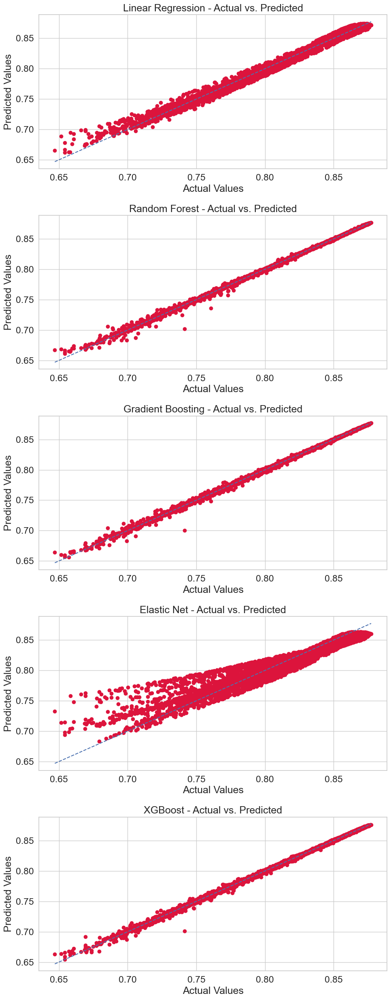

In [51]:
fig, axes = plt.subplots(len(models), 1, figsize=(10, 5 * len(models)))
for idx, (model_name, (actual, predicted)) in enumerate(predicted.items()):
    axes[idx].scatter(actual, predicted, c='crimson')
    axes[idx].plot([actual.min(), actual.max()], [actual.min(), actual.max()], 'b--')
    axes[idx].set_title(f'{model_name} - Actual vs. Predicted')
    axes[idx].set_xlabel('Actual Values')
    axes[idx].set_ylabel('Predicted Values')
plt.tight_layout()
plt.show()

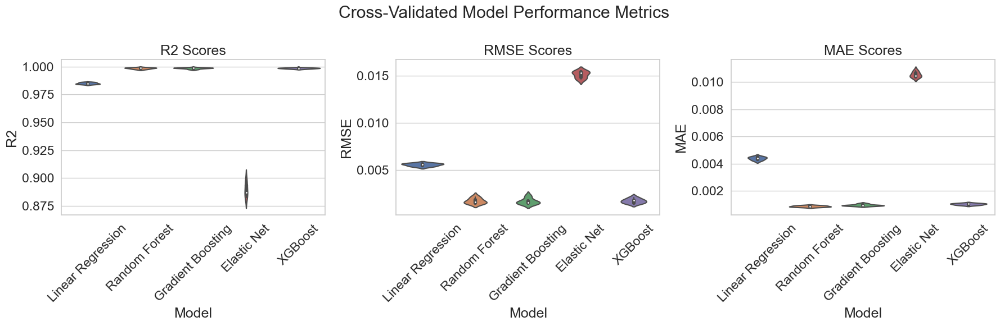

In [52]:

# Models defined earlier, using the same models dictionary as above
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(max_depth=None, min_samples_split=2, n_estimators=200),
    "Gradient Boosting": GradientBoostingRegressor(learning_rate=0.1, max_depth=7, n_estimators=300),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror', learning_rate=0.1, max_depth=7, n_estimators=100)
}

# Define custom scorers for RMSE and MAE
def rmse_score(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def mae_score(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

# Scoring dictionary
scoring = {
    'R2': 'r2',
    'RMSE': make_scorer(rmse_score, greater_is_better=False),
    'MAE': make_scorer(mae_score, greater_is_better=False)
}

# Dictionary to collect the metric scores for each model and metric
metric_scores = []

# Perform k-fold cross-validation
for model_name, model in models.items():
    for score_name, scorer in scoring.items():
        scores = cross_val_score(model, X, y, cv=kf, scoring=scorer)
        # Adjust scores based on whether they are typically 'higher is better' or 'lower is better'
        metric_scores.extend([{'Model': model_name, 'Metric': score_name, 'Score': -score if score_name != 'R2' else score} for score in scores])

# Convert metric scores to DataFrame
score_df = pd.DataFrame(metric_scores)

# Plotting the metrics using violin plots
plt.figure(figsize=(18, 6))
plt.suptitle('Cross-Validated Model Performance Metrics')

# Plot for each metric
for i, metric in enumerate(['R2', 'RMSE', 'MAE']):
    plt.subplot(1, 3, i+1)
    sns.violinplot(data=score_df[score_df['Metric'] == metric], x='Model', y='Score')
    plt.title(f'{metric} Scores')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


                   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE
Linear Regression  0.984946  0.984207    0.005583   0.005670   0.004388  0.004466
Random Forest      0.998342  0.990989    0.001850   0.004202   0.000986  0.002487
Gradient Boosting  0.998484  0.992082    0.001768   0.003975   0.001006  0.002263
Elastic Net        0.889559  0.886353    0.015115   0.015209   0.010510  0.010732
XGBoost            0.998454  0.992490    0.001784   0.003892   0.001094  0.002421


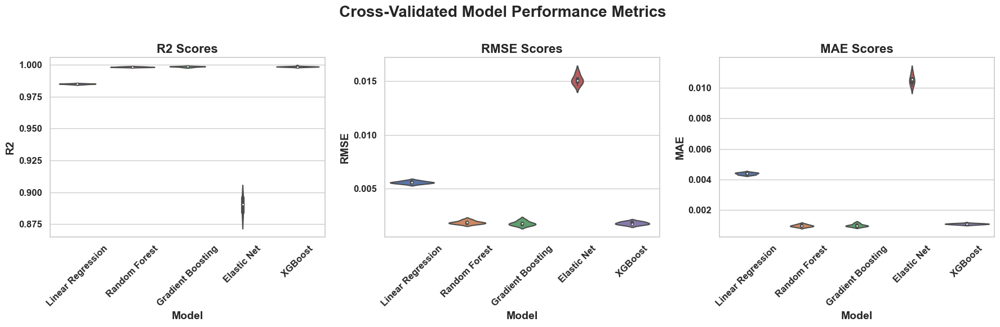

In [53]:
# Define custom scorer for RMSE
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Models
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(max_depth=None, min_samples_split=2, n_estimators=200),
    "Gradient Boosting": GradientBoostingRegressor(learning_rate=0.1, max_depth=7, n_estimators=300),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror', learning_rate=0.1, max_depth=7, n_estimators=100)
}

results = {}
predicted = {}
for name, model in models.items():
    # Get cross-validated predictions for plotting actual vs. predicted values
    y_pred = cross_val_predict(model, X_train, y_train, cv=kf, n_jobs=-1)
    predicted[name] = (y_test, y_pred)  # Store actual and predicted values for later plotting

    # Calculate metrics
    train_r2 = cross_val_score(model, X_train, y_train, cv=kf, scoring='r2', n_jobs=-1).mean()
    test_r2 = cross_val_score(model, X_test, y_test, cv=kf, scoring='r2', n_jobs=-1).mean()
    train_rmse = cross_val_score(model, X_train, y_train, cv=kf, scoring=make_scorer(rmse), n_jobs=-1).mean()
    test_rmse = cross_val_score(model, X_test, y_test, cv=kf, scoring=make_scorer(rmse), n_jobs=-1).mean()
    train_mae = -cross_val_score(model, X_train, y_train, cv=kf, scoring='neg_mean_absolute_error', n_jobs=-1).mean()
    test_mae = -cross_val_score(model, X_test, y_test, cv=kf, scoring='neg_mean_absolute_error', n_jobs=-1).mean()

    results[name] = {
        "Train R²": train_r2, "Test R²": test_r2,
        "Train RMSE": train_rmse, "Test RMSE": test_rmse,
        "Train MAE": train_mae, "Test MAE": test_mae
    }

# Display cross-validated metrics
results_df = pd.DataFrame(results).T
print(results_df.to_string())

# Models defined earlier, using the same models dictionary as above

# Define custom scorers for RMSE and MAE
def rmse_score(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def mae_score(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

# Scoring dictionary
scoring = {
    'R2': 'r2',
    'RMSE': make_scorer(rmse_score, greater_is_better=False),
    'MAE': make_scorer(mae_score, greater_is_better=False)
}

# Dictionary to collect the metric scores for each model and metric
metric_scores = []

# Perform k-fold cross-validation
for model_name, model in models.items():
    for score_name, scorer in scoring.items():
        scores = cross_val_score(model, X_train, y_train, cv=kf, scoring=scorer)
        # Adjust scores based on whether they are typically 'higher is better' or 'lower is better'
        metric_scores.extend([{'Model': model_name, 'Metric': score_name, 'Score': -score if score_name != 'R2' else score} for score in scores])

# Convert metric scores to DataFrame
score_df = pd.DataFrame(metric_scores)

# Increase font size and weight
sns.set_context("paper", font_scale=1.5)
sns.set(font_scale=1.5, style="whitegrid")

# Plotting the metrics using violin plots
plt.figure(figsize=(18, 6))
plt.suptitle('Cross-Validated Model Performance Metrics', fontsize=20, fontweight='bold')

# Plot for each metric
for i, metric in enumerate(['R2', 'RMSE', 'MAE']):
    plt.subplot(1, 3, i+1)
    sns.violinplot(data=score_df[score_df['Metric'] == metric], x='Model', y='Score')
    plt.title(f'{metric} Scores', fontsize=16, fontweight='bold')
    plt.ylabel(metric, fontsize=14, fontweight='bold')
    plt.xlabel('Model', fontsize=14, fontweight='bold')
    plt.xticks(rotation=45, fontsize=12, fontweight='bold')
    plt.yticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()


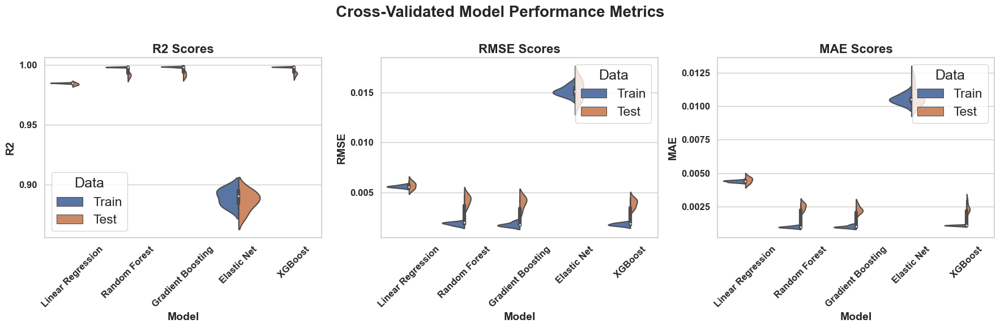

In [54]:
for model_name, model in models.items():
    for score_name, scorer in scoring.items():
        scores_train = cross_val_score(model, X_train, y_train, cv=kf, scoring=scorer)
        scores_test = cross_val_score(model, X_test, y_test, cv=kf, scoring=scorer)
        # Adjust scores based on whether they are typically 'higher is better' or 'lower is better'
        metric_scores.extend([{'Model': model_name, 'Metric': score_name, 'Score': -score if score_name != 'R2' else score, 'Data': 'Train'} for score in scores_train])
        metric_scores.extend([{'Model': model_name, 'Metric': score_name, 'Score': -score if score_name != 'R2' else score, 'Data': 'Test'} for score in scores_test])

# Convert metric scores to DataFrame
score_df = pd.DataFrame(metric_scores)

# Increase font size and weight
sns.set_context("paper", font_scale=1.5)
sns.set(font_scale=1.5, style="whitegrid")

# Plotting the metrics using violin plots
plt.figure(figsize=(18, 6))
plt.suptitle('Cross-Validated Model Performance Metrics', fontsize=20, fontweight='bold')

# Plot for each metric
for i, metric in enumerate(['R2', 'RMSE', 'MAE']):
    plt.subplot(1, 3, i+1)
    sns.violinplot(data=score_df[score_df['Metric'] == metric], x='Model', y='Score', hue='Data', split=True)
    plt.title(f'{metric} Scores', fontsize=16, fontweight='bold')
    plt.ylabel(metric, fontsize=14, fontweight='bold')
    plt.xlabel('Model', fontsize=14, fontweight='bold')
    plt.xticks(rotation=45, fontsize=12, fontweight='bold')
    plt.yticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

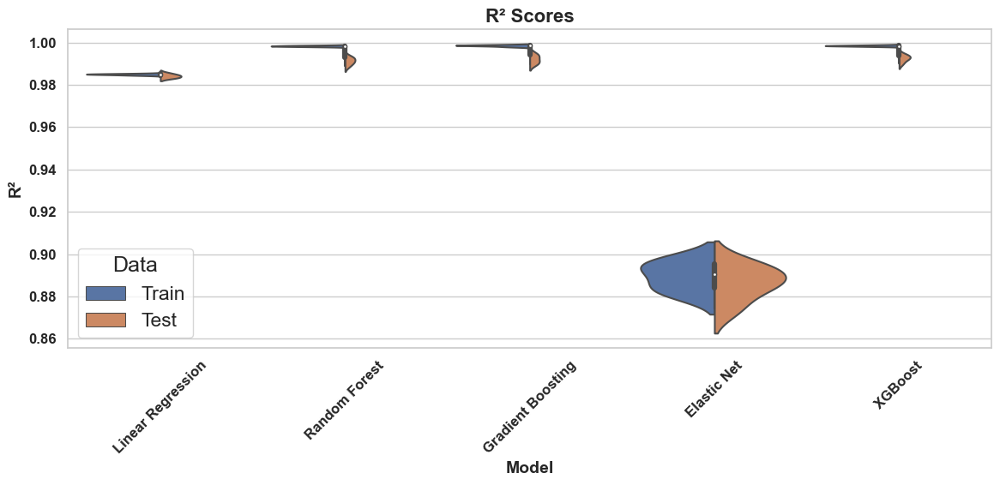

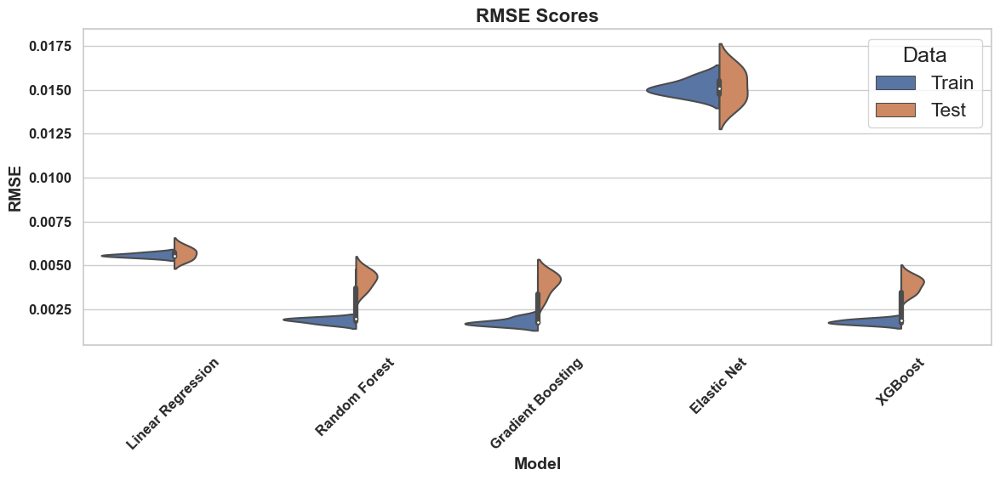

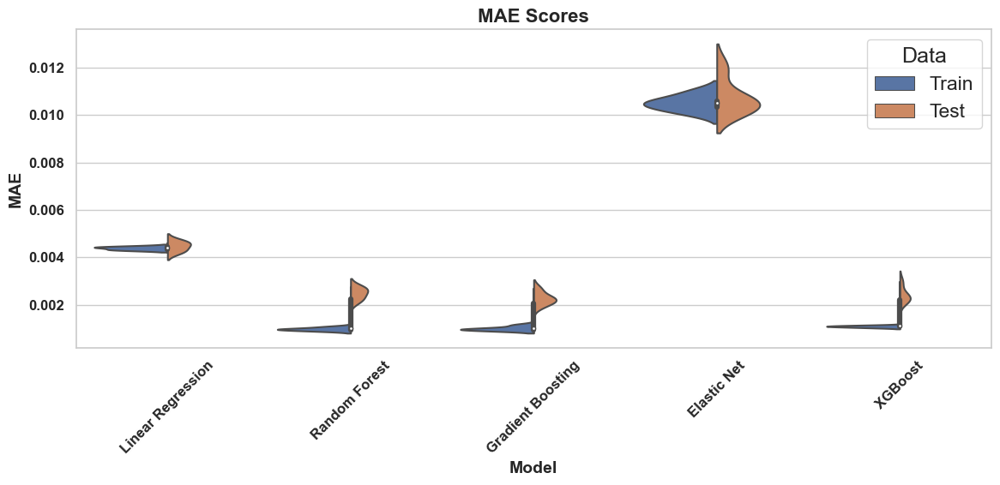

In [56]:
# Increase font size and weight
sns.set_context("paper", font_scale=1.5)
sns.set(font_scale=1.5, style="whitegrid")

# Plotting the R² scores using violin plots
plt.figure(figsize=(12, 6))
sns.violinplot(data=score_df[score_df['Metric'] == 'R2'], x='Model', y='Score', hue='Data', split=True)
plt.title('R² Scores', fontsize=16, fontweight='bold')
plt.ylabel('R²', fontsize=14, fontweight='bold')
plt.xlabel('Model', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

# Plotting the RMSE scores using violin plots
plt.figure(figsize=(12, 6))
sns.violinplot(data=score_df[score_df['Metric'] == 'RMSE'], x='Model', y='Score', hue='Data', split=True)
plt.title('RMSE Scores', fontsize=16, fontweight='bold')
plt.ylabel('RMSE', fontsize=14, fontweight='bold')
plt.xlabel('Model', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

# Plotting the MAE scores using violin plots
plt.figure(figsize=(12, 6))
sns.violinplot(data=score_df[score_df['Metric'] == 'MAE'], x='Model', y='Score', hue='Data', split=True)
plt.title('MAE Scores', fontsize=16, fontweight='bold')
plt.ylabel('MAE', fontsize=14, fontweight='bold')
plt.xlabel('Model', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()


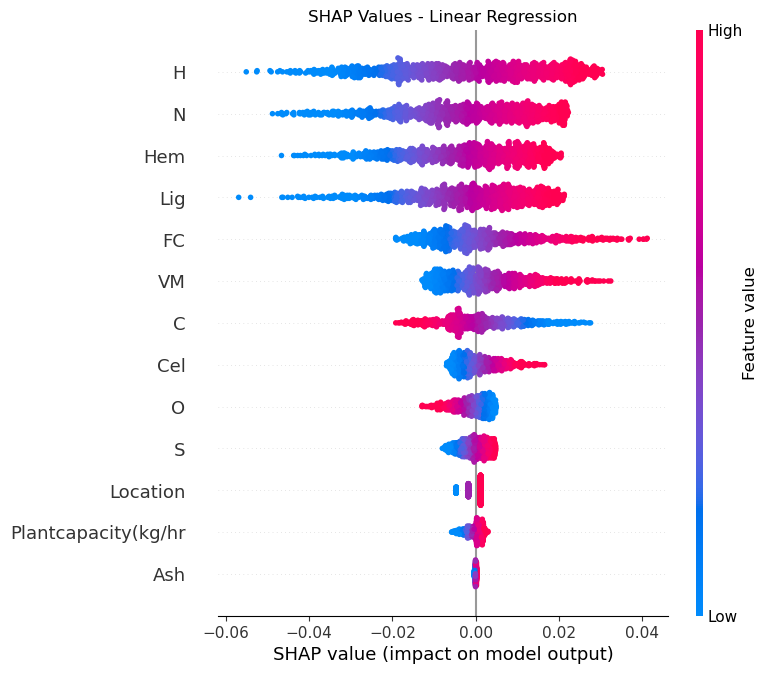

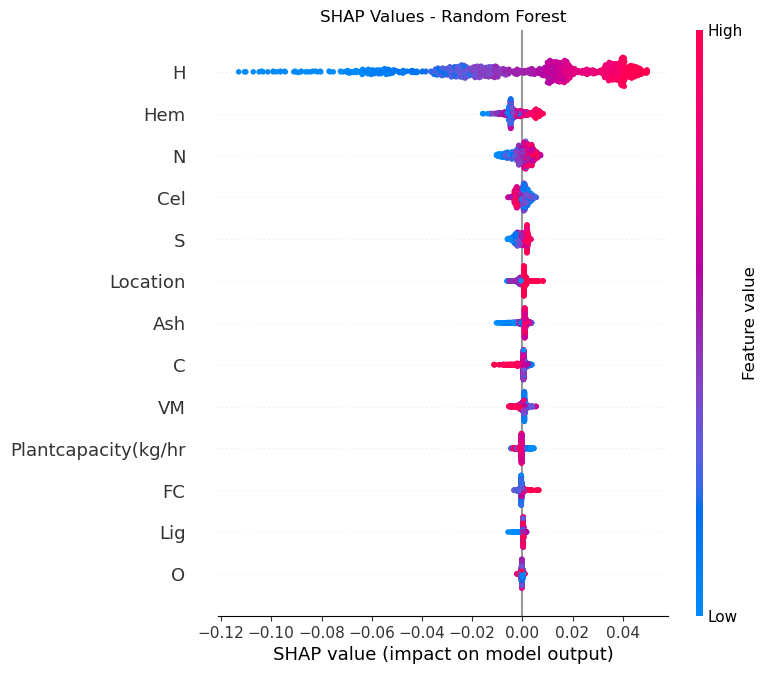

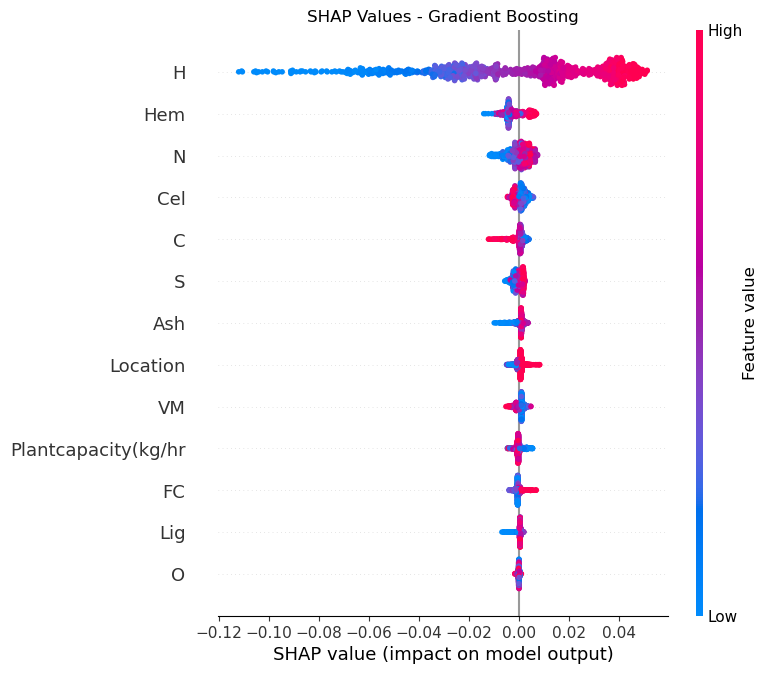

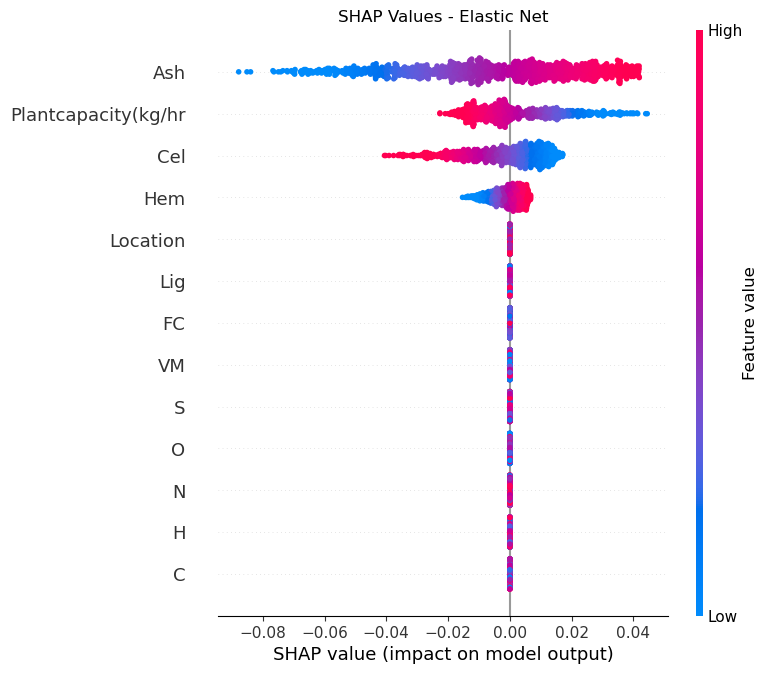

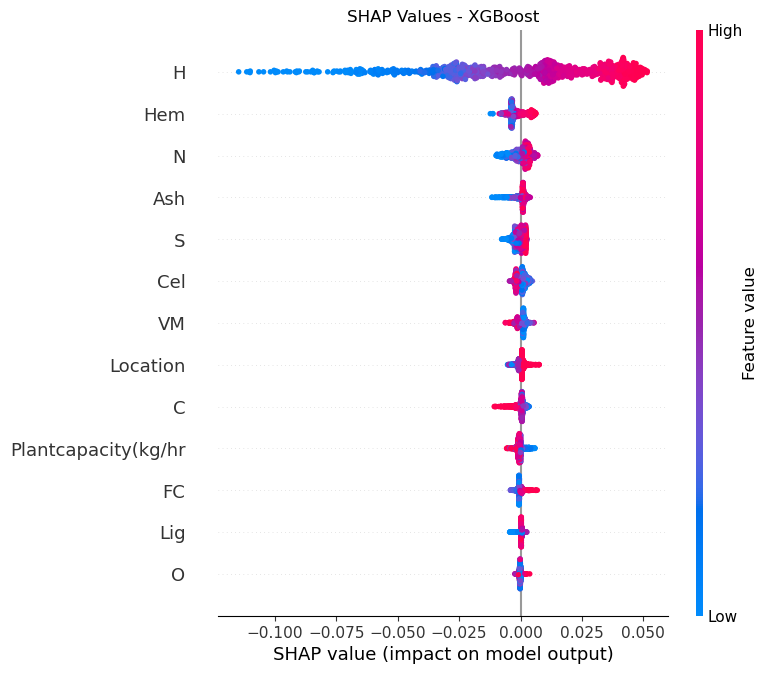

In [33]:
# Dictionary of models
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(max_depth=None, min_samples_split=2, n_estimators=200),
    "Gradient Boosting": GradientBoostingRegressor(learning_rate=0.1, max_depth=7, n_estimators=300),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror', learning_rate=0.1, max_depth=7, n_estimators=100)
}

# Compute SHAP values for each model
shap_values_dict = {}
for model_name, model in models.items():
    # Fit the model
    model.fit(X_train, y_train)
    # Compute SHAP values
    if model_name in ["Random Forest", "Gradient Boosting", "XGBoost"]:
        
        
        explainer = shap.TreeExplainer(model)
    elif model_name in ["Linear Regression", "Elastic Net"]:
        explainer = shap.LinearExplainer(model, X_train)
    else:
        raise ValueError(f"Model {model_name} is not supported for SHAP computation.")
    shap_values = explainer.shap_values(X_test)
    shap_values_dict[model_name] = shap_values

# Plot SHAP values
for model_name, shap_values in shap_values_dict.items():
    shap.summary_plot(shap_values, X_test, show=False)
    plt.title(f'SHAP Values - {model_name}')
    plt.show()


Testing with Original Data

In [18]:
original_df.sample(frac=1)

,C,H,N,O,S,VM,Ash,FC,Cel,Hem,Lig,Plantcapacity(kg/hr,MSP,Location_China,Location_UK,Location_US
75,47.100000,6.500000,0.600000,45.800000,0.000000,71.700000,1.700000,26.600000,39.200000,22.400000,25.200000,25000,0.4224,1,0,0
110,51.710000,5.320000,0.330000,42.640000,0.000000,81.797235,2.419355,15.783410,45.000000,28.000000,20.000000,50000,0.9800,0,0,1
101,46.336185,6.204267,0.494692,46.964856,0.000000,74.240000,2.970000,22.790000,44.400000,41.370000,2.110000,50000,1.0100,0,0,1
70,46.336185,6.204267,0.494692,46.964856,0.000000,74.240000,2.970000,22.790000,44.400000,41.370000,2.110000,25000,0.4356,1,0,0
141,51.710000,5.320000,0.330000,42.640000,0.000000,81.797235,2.419355,15.783410,45.000000,28.000000,20.000000,50000,1.0192,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,44.480000,6.280000,8.210000,40.490000,0.540000,77.497780,6.472025,16.030195,22.775726,55.419525,2.955145,25000,1.2792,0,1,0
119,50.840673,5.904724,0.300240,42.934347,0.020016,85.300000,0.400000,14.300000,44.500000,27.500000,26.000000,50000,1.0500,0,0,1
132,46.336185,6.204267,0.494692,46.964856,0.000000,74.240000,2.970000,22.790000,44.400000,41.370000,2.110000,50000,1.0504,0,1,0
5,44.695108,7.236989,1.194997,46.872906,0.000000,94.161220,2.472767,3.366013,45.000000,27.000000,10.000000,25000,0.7800,0,0,1


In [20]:
df_merged = gan_df_cleaned.append(original_df, ignore_index=True)


C:\Users\balun\AppData\Local\Temp\ipykernel_16980\3410826693.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_merged = gan_df_cleaned.append(original_df, ignore_index=True)


In [21]:
print(df_merged)

             C         H         N          O         S         VM        Ash  \
0    48.183010  6.180788  4.648332  49.451080  0.619473  87.300392  15.911248   
1    57.503422  5.961753  3.945359  52.291683  0.041020  91.331909  16.761709   
2    54.663929  8.440696  5.484559  51.866573  0.061936  89.619225  27.899183   
3    56.615273  5.486185  5.421540  49.449921  0.275393  90.379448   6.006124   
4    56.800148  7.512713  3.015928  50.451401  0.511558  81.811958   7.661277   
..         ...       ...       ...        ...       ...        ...        ...   
527  50.840673  5.904724  0.300240  42.934347  0.020016  85.300000   0.400000   
528  52.036199  6.979295  3.551351  36.295077  1.138078  57.460000  27.070000   
529  53.200000  6.100000  0.100000  40.600000  0.000000  80.600000   0.800000   
530  55.235524  5.890589  1.580158  37.293729  0.000000  84.041451   4.124352   
531  60.460000  9.080000  3.100000  27.360000  0.000000  85.683987   2.332980   

            FC        Cel  

In [24]:
X_train = gan_df_cleaned.drop(columns=['MSP'])
X_test = original_df.drop(columns=['MSP'])
y_train = gan_df_cleaned['MSP']
y_test = original_df['MSP']

In [26]:
# Define the number of folds for k-fold cross-validation
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

def rmse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred, squared=False)

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror')
}

# Define hyperparameter grids for each model
param_grids = {
    "Linear Regression": {},
    "Random Forest": {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10]
    },
    "Gradient Boosting": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    },
    "Elastic Net": {
        'alpha': [0.1, 0.5, 1.0],
        'l1_ratio': [0.1, 0.5, 0.9]
    },
    "XGBoost": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    }
}

scorers = {
    "R²": make_scorer(r2_score),
    "RMSE": make_scorer(rmse, greater_is_better=False),
    "MAE": make_scorer(mean_absolute_error, greater_is_better=False)
}

results = {}
for name, model in models.items():
    # Perform Grid Search for hyperparameter optimization
    param_grid = param_grids[name]
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scorers, refit='RMSE', cv=kf, n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Store grid search results
    results[name] = grid_search.cv_results_

    # Get the best hyperparameters and best score (converted to positive RMSE)
    best_params = grid_search.best_params_
    best_score_rmse = -grid_search.best_score_  # Negate to convert to positive RMSE

    # Update the model with the best hyperparameters
    best_model = grid_search.best_estimator_
    
    # Calculate metrics for training data (no need for cross_val_score since we used refit)
    y_pred_train = best_model.predict(X_train)
    train_r2 = r2_score(y_train, y_pred_train)
    train_rmse = rmse(y_train, y_pred_train)
    train_mae = mean_absolute_error(y_train, y_pred_train)

    # Fit the model on testing data to get test metrics
    y_pred_test = best_model.predict(X_test)
    test_r2 = r2_score(y_test, y_pred_test)
    test_rmse = rmse(y_test, y_pred_test)
    test_mae = mean_absolute_error(y_test, y_pred_test)

    results[name] = {
        "Train R²": train_r2, "Test R²": test_r2,
        "Train RMSE": train_rmse, "Test RMSE": test_rmse,
        "Train MAE": train_mae, "Test MAE": test_mae,
        "Best Hyperparameters": best_params,
        "Best Score RMSE": best_score_rmse
    }

# Display cross-validated metrics
for name, result in results.items():
    print(f"\nResults for {name}:")
    print(pd.DataFrame([result]))
# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Save the DataFrame to an Excel file
results_df.to_excel("original_gan_model_results.xlsx", index=True)


Results for Linear Regression:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.581023 -1.356664    0.157156   0.370501    0.12589  0.285804   

  Best Hyperparameters  Best Score RMSE  
0                   {}         0.165624  

Results for Random Forest:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.934343 -0.335024    0.062212    0.27886   0.050511  0.228367   

                                Best Hyperparameters  Best Score RMSE  
0  {'max_depth': 10, 'min_samples_split': 2, 'n_e...          0.16447  

Results for Gradient Boosting:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.995224 -0.765864    0.016779   0.320715   0.013452  0.247784   

                                Best Hyperparameters  Best Score RMSE  
0  {'learning_rate': 0.1, 'max_depth': 3, 'n_esti...         0.158642  

Results for Elastic Net:
   Train R²  Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.557974 -1.22177    0

GAN Augumented Data

In [36]:
# Split the original data into training and testing sets
original_data_train, original_data_test = train_test_split(original_df, test_size=0.3, random_state=42)

# Combine original and GAN data for training
training_data = pd.concat([original_data_train, gan_df_cleaned], axis=0)

# Separate features (X_train) and target variable (y_train) for training data
X_train = training_data.drop(columns=['MSP'])
y_train = training_data['MSP']

# Separate features (X_test) and target variable (y_test) for original test data
X_test = original_df.drop(columns=['MSP'])
y_test = original_df['MSP']


In [37]:
# Define the number of folds for k-fold cross-validation
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

def rmse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred, squared=False)

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror')
}

# Define hyperparameter grids for each model
param_grids = {
    "Linear Regression": {},
    "Random Forest": {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10]
    },
    "Gradient Boosting": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    },
    "Elastic Net": {
        'alpha': [0.1, 0.5, 1.0],
        'l1_ratio': [0.1, 0.5, 0.9]
    },
    "XGBoost": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    }
}

scorers = {
    "R²": make_scorer(r2_score),
    "RMSE": make_scorer(rmse, greater_is_better=False),
    "MAE": make_scorer(mean_absolute_error, greater_is_better=False)
}

results = {}
for name, model in models.items():
    # Perform Grid Search for hyperparameter optimization
    param_grid = param_grids[name]
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scorers, refit='RMSE', cv=kf, n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Store grid search results
    results[name] = grid_search.cv_results_

    # Get the best hyperparameters and best score (converted to positive RMSE)
    best_params = grid_search.best_params_
    best_score_rmse = -grid_search.best_score_  # Negate to convert to positive RMSE

    # Update the model with the best hyperparameters
    best_model = grid_search.best_estimator_
    
    # Calculate metrics for training data (no need for cross_val_score since we used refit)
    y_pred_train = best_model.predict(X_train)
    train_r2 = r2_score(y_train, y_pred_train)
    train_rmse = rmse(y_train, y_pred_train)
    train_mae = mean_absolute_error(y_train, y_pred_train)

    # Fit the model on testing data to get test metrics
    y_pred_test = best_model.predict(X_test)
    test_r2 = r2_score(y_test, y_pred_test)
    test_rmse = rmse(y_test, y_pred_test)
    test_mae = mean_absolute_error(y_test, y_pred_test)

    results[name] = {
        "Train R²": train_r2, "Test R²": test_r2,
        "Train RMSE": train_rmse, "Test RMSE": test_rmse,
        "Train MAE": train_mae, "Test MAE": test_mae,
        "Best Hyperparameters": best_params,
        "Best Score RMSE": best_score_rmse
    }

# Display cross-validated metrics
for name, result in results.items():
    print(f"\nResults for {name}:")
    print(pd.DataFrame([result]))
# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Save the DataFrame to an Excel file
results_df.to_excel("Augumented_gan_model_results.xlsx", index=True)


Results for Linear Regression:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.437587  0.312451    0.186925   0.200121   0.148853  0.155394   

  Best Hyperparameters  Best Score RMSE  
0                   {}         0.194822  

Results for Random Forest:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.945278  0.910374    0.058307   0.072253   0.044006  0.042728   

                                Best Hyperparameters  Best Score RMSE  
0  {'max_depth': None, 'min_samples_split': 2, 'n...         0.158236  

Results for Gradient Boosting:
   Train R²  Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.988683  0.97446    0.026516    0.03857   0.021081  0.026762   

                                Best Hyperparameters  Best Score RMSE  
0  {'learning_rate': 0.1, 'max_depth': 3, 'n_esti...         0.143193  

Results for Elastic Net:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.411769  0.224793    0

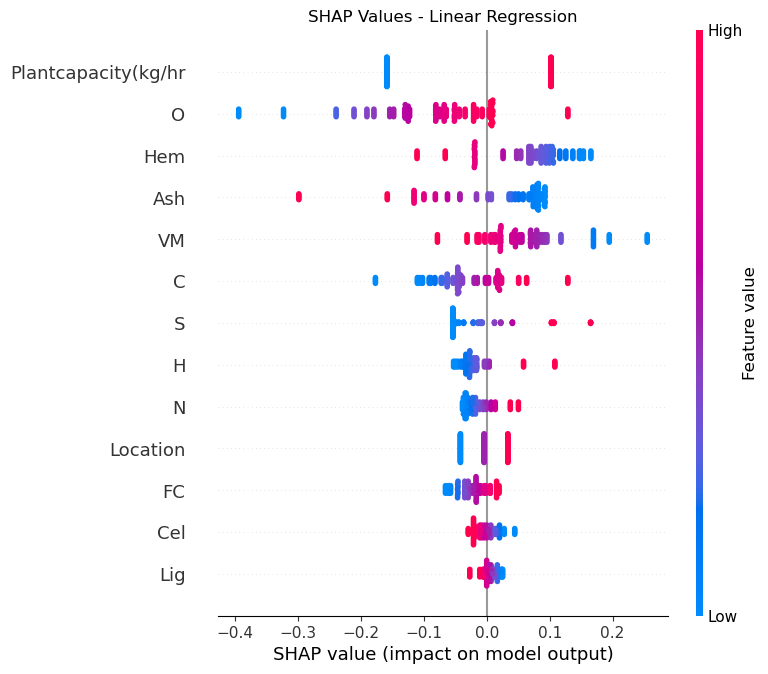

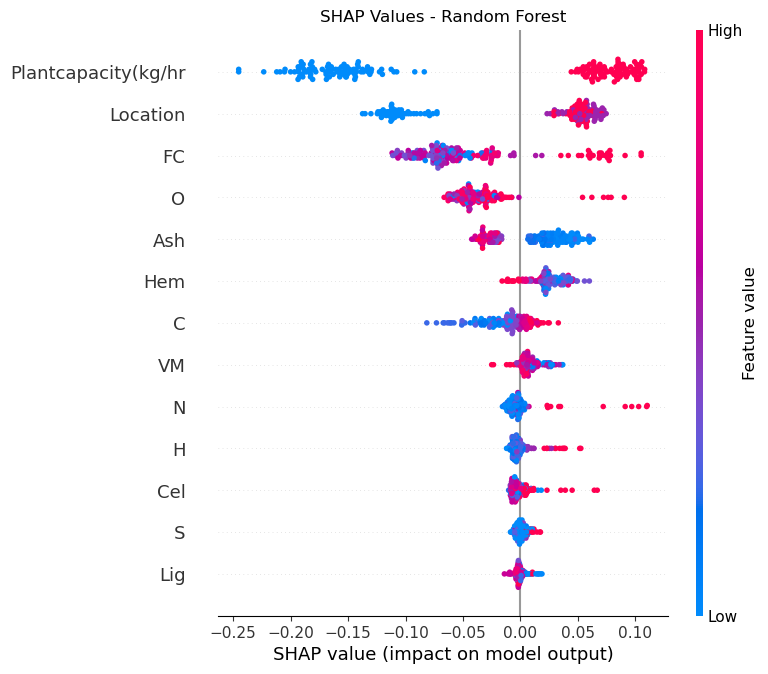

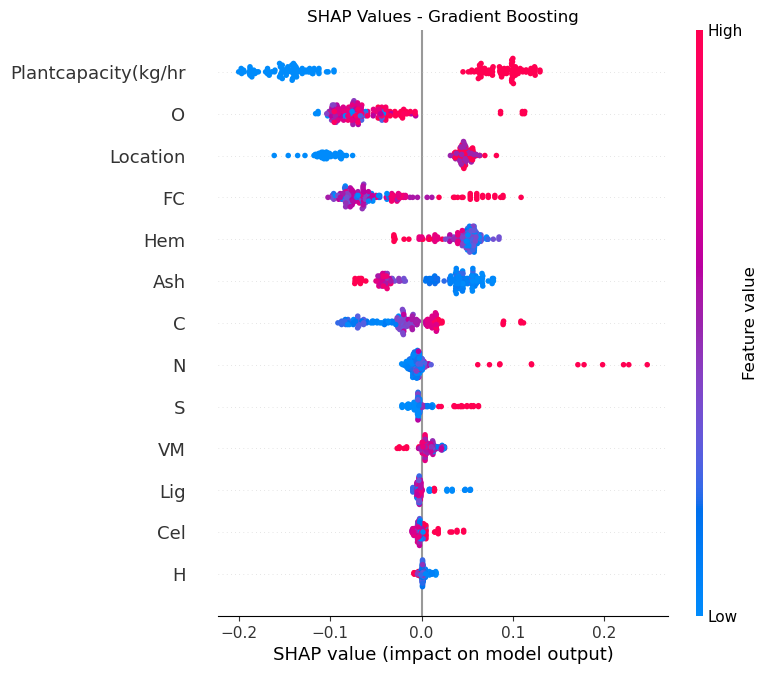

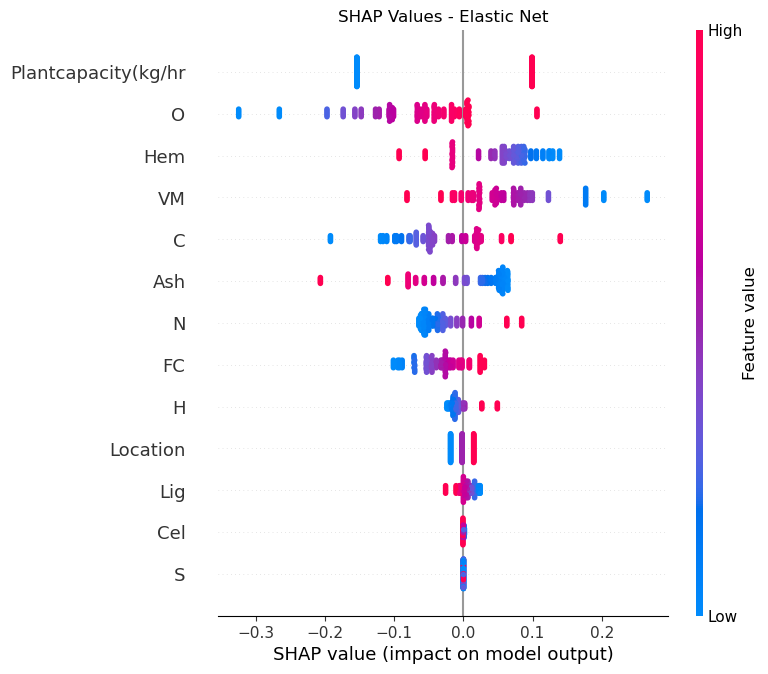

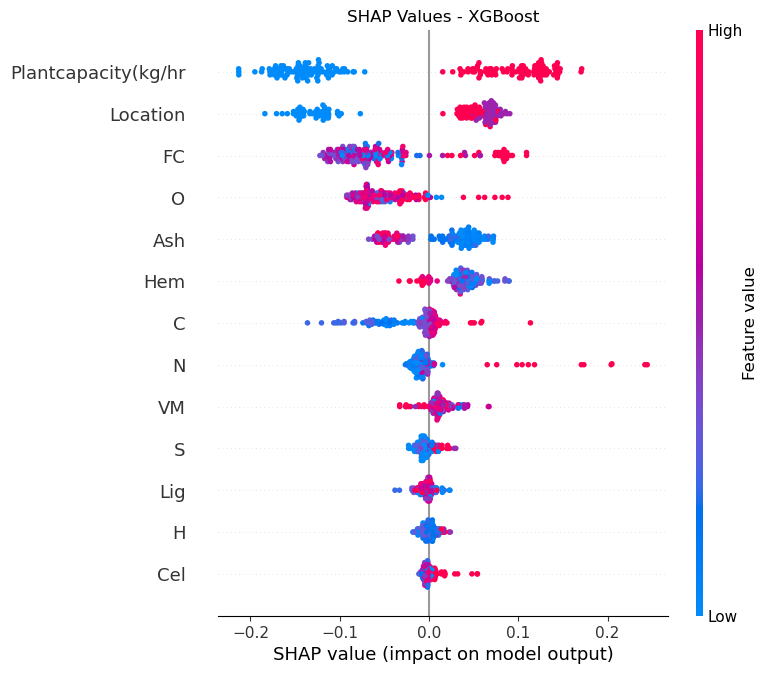

In [38]:
# Compute SHAP values for each model
shap_values_dict = {}
for model_name, model in models.items():
    # Fit the model
    model.fit(X_train, y_train)
    # Compute SHAP values
    if model_name in ["Random Forest", "Gradient Boosting", "XGBoost"]:
        
        
        explainer = shap.TreeExplainer(model)
    elif model_name in ["Linear Regression", "Elastic Net"]:
        explainer = shap.LinearExplainer(model, X_train)
    else:
        raise ValueError(f"Model {model_name} is not supported for SHAP computation.")
    shap_values = explainer.shap_values(X_test)
    shap_values_dict[model_name] = shap_values

# Plot SHAP values
for model_name, shap_values in shap_values_dict.items():
    shap.summary_plot(shap_values, X_test, show=False)
    plt.title(f'SHAP Values - {model_name}')
    plt.show()

In [39]:
X_train = vae_df_cleaned.drop(columns=['MSP'])
X_test = original_df.drop(columns=['MSP'])
y_train = vae_df_cleaned['MSP']
y_test = original_df['MSP']

In [40]:
# Define the number of folds for k-fold cross-validation
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

def rmse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred, squared=False)

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror')
}

# Define hyperparameter grids for each model
param_grids = {
    "Linear Regression": {},
    "Random Forest": {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10]
    },
    "Gradient Boosting": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    },
    "Elastic Net": {
        'alpha': [0.1, 0.5, 1.0],
        'l1_ratio': [0.1, 0.5, 0.9]
    },
    "XGBoost": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    }
}

scorers = {
    "R²": make_scorer(r2_score),
    "RMSE": make_scorer(rmse, greater_is_better=False),
    "MAE": make_scorer(mean_absolute_error, greater_is_better=False)
}

results = {}
for name, model in models.items():
    # Perform Grid Search for hyperparameter optimization
    param_grid = param_grids[name]
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scorers, refit='RMSE', cv=kf, n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Store grid search results
    results[name] = grid_search.cv_results_

    # Get the best hyperparameters and best score (converted to positive RMSE)
    best_params = grid_search.best_params_
    best_score_rmse = -grid_search.best_score_  # Negate to convert to positive RMSE

    # Update the model with the best hyperparameters
    best_model = grid_search.best_estimator_
    
    # Calculate metrics for training data (no need for cross_val_score since we used refit)
    y_pred_train = best_model.predict(X_train)
    train_r2 = r2_score(y_train, y_pred_train)
    train_rmse = rmse(y_train, y_pred_train)
    train_mae = mean_absolute_error(y_train, y_pred_train)

    # Fit the model on testing data to get test metrics
    y_pred_test = best_model.predict(X_test)
    test_r2 = r2_score(y_test, y_pred_test)
    test_rmse = rmse(y_test, y_pred_test)
    test_mae = mean_absolute_error(y_test, y_pred_test)

    results[name] = {
        "Train R²": train_r2, "Test R²": test_r2,
        "Train RMSE": train_rmse, "Test RMSE": test_rmse,
        "Train MAE": train_mae, "Test MAE": test_mae,
        "Best Hyperparameters": best_params,
        "Best Score RMSE": best_score_rmse
    }

# Display cross-validated metrics
for name, result in results.items():
    print(f"\nResults for {name}:")
    print(pd.DataFrame([result]))
# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Save the DataFrame to an Excel file
results_df.to_excel("originL_VAE_model_results.xlsx", index=True)


Results for Linear Regression:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.985072 -0.130824     0.00556   0.256648   0.004377  0.209134   

  Best Hyperparameters  Best Score RMSE  
0                   {}         0.005573  

Results for Random Forest:
   Train R²  Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.999831 -0.05079    0.000592     0.2474   0.000285  0.202109   

                                Best Hyperparameters  Best Score RMSE  
0  {'max_depth': None, 'min_samples_split': 2, 'n...         0.001754  

Results for Gradient Boosting:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.999958 -0.049811    0.000294   0.247284   0.000229  0.202517   

                                Best Hyperparameters  Best Score RMSE  
0  {'learning_rate': 0.1, 'max_depth': 7, 'n_esti...         0.001704  

Results for Elastic Net:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.889684 -5.701375    0

In [41]:
# Split the original data into training and testing sets
original_data_train, original_data_test = train_test_split(original_df, test_size=0.2, random_state=42)

# Combine original and GAN data for training
training_data = pd.concat([original_data_train, vae_df_cleaned], axis=0)

# Separate features (X_train) and target variable (y_train) for training data
X_train = training_data.drop(columns=['MSP'])
y_train = training_data['MSP']

# Separate features (X_test) and target variable (y_test) for original test data
X_test = original_df.drop(columns=['MSP'])
y_test = original_df['MSP']


In [42]:
# Define the number of folds for k-fold cross-validation
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

def rmse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred, squared=False)

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "Elastic Net": ElasticNet(alpha=0.1, l1_ratio=0.1, random_state=42),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror')
}

# Define hyperparameter grids for each model
param_grids = {
    "Linear Regression": {},
    "Random Forest": {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10]
    },
    "Gradient Boosting": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    },
    "Elastic Net": {
        'alpha': [0.1, 0.5, 1.0],
        'l1_ratio': [0.1, 0.5, 0.9]
    },
    "XGBoost": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    }
}

scorers = {
    "R²": make_scorer(r2_score),
    "RMSE": make_scorer(rmse, greater_is_better=False),
    "MAE": make_scorer(mean_absolute_error, greater_is_better=False)
}

results = {}
for name, model in models.items():
    # Perform Grid Search for hyperparameter optimization
    param_grid = param_grids[name]
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scorers, refit='RMSE', cv=kf, n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Store grid search results
    results[name] = grid_search.cv_results_

    # Get the best hyperparameters and best score (converted to positive RMSE)
    best_params = grid_search.best_params_
    best_score_rmse = -grid_search.best_score_  # Negate to convert to positive RMSE

    # Update the model with the best hyperparameters
    best_model = grid_search.best_estimator_
    
    # Calculate metrics for training data (no need for cross_val_score since we used refit)
    y_pred_train = best_model.predict(X_train)
    train_r2 = r2_score(y_train, y_pred_train)
    train_rmse = rmse(y_train, y_pred_train)
    train_mae = mean_absolute_error(y_train, y_pred_train)

    # Fit the model on testing data to get test metrics
    y_pred_test = best_model.predict(X_test)
    test_r2 = r2_score(y_test, y_pred_test)
    test_rmse = rmse(y_test, y_pred_test)
    test_mae = mean_absolute_error(y_test, y_pred_test)

    results[name] = {
        "Train R²": train_r2, "Test R²": test_r2,
        "Train RMSE": train_rmse, "Test RMSE": test_rmse,
        "Train MAE": train_mae, "Test MAE": test_mae,
        "Best Hyperparameters": best_params,
        "Best Score RMSE": best_score_rmse
    }

# Display cross-validated metrics
for name, result in results.items():
    print(f"\nResults for {name}:")
    print(pd.DataFrame([result]))
# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Save the DataFrame to an Excel file
results_df.to_excel("Augumented_vae_model_results.xlsx", index=True)

C:\Users\balun\anaconda3\lib\site-packages\joblib\externals\loky\process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(



Results for Linear Regression:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.757535  0.510443    0.029618   0.168866   0.011367  0.143602   

  Best Hyperparameters  Best Score RMSE  
0                   {}         0.030862  

Results for Random Forest:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.985473  0.915931     0.00725   0.069978   0.001149   0.04179   

                                Best Hyperparameters  Best Score RMSE  
0  {'max_depth': None, 'min_samples_split': 2, 'n...         0.018881  

Results for Gradient Boosting:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.997353  0.987812    0.003095   0.026644   0.001984   0.01336   

                                Best Hyperparameters  Best Score RMSE  
0  {'learning_rate': 0.1, 'max_depth': 3, 'n_esti...         0.009197  

Results for Elastic Net:
   Train R²   Test R²  Train RMSE  Test RMSE  Train MAE  Test MAE  \
0  0.606394  0.375812   

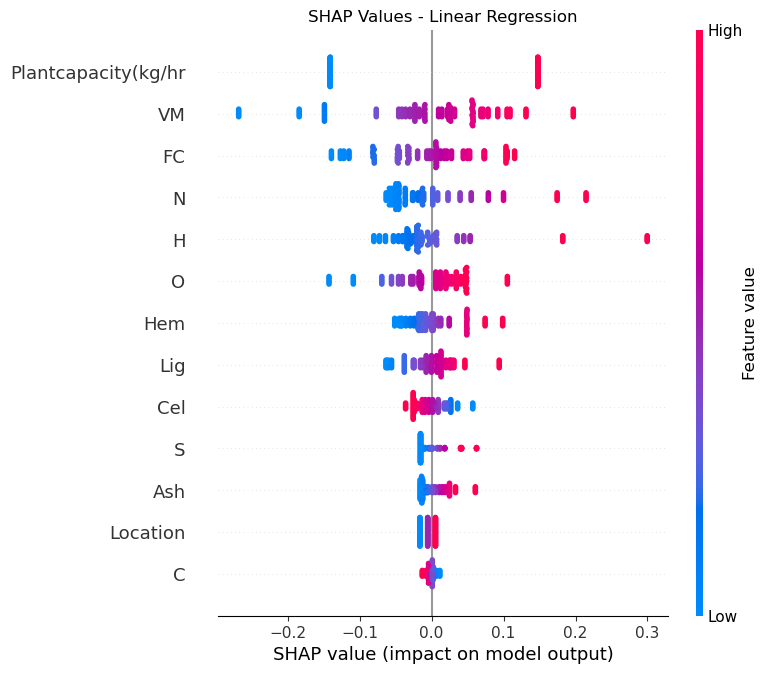

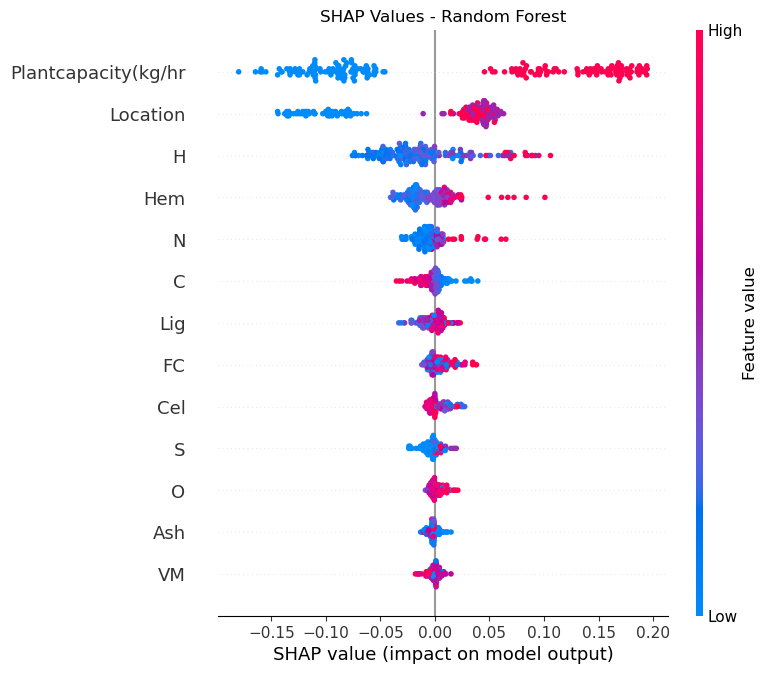

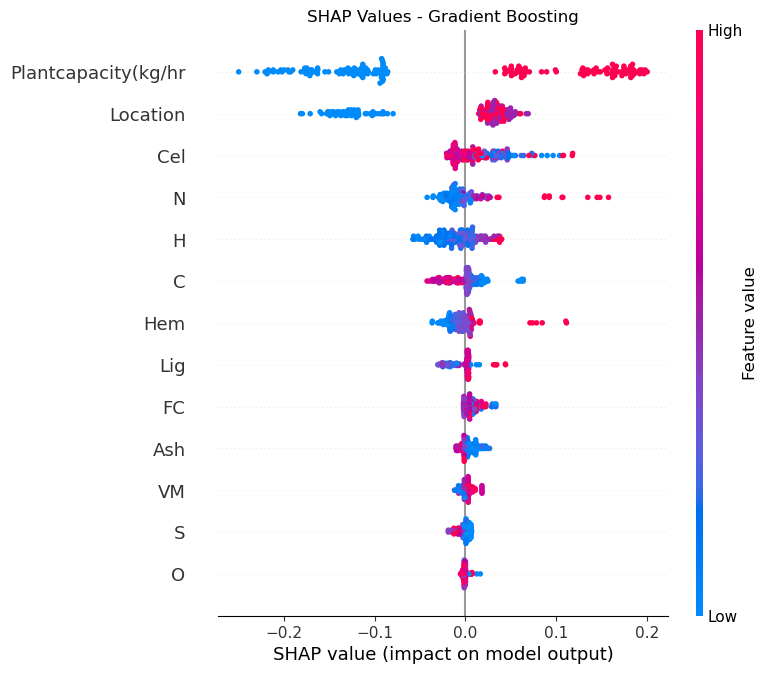

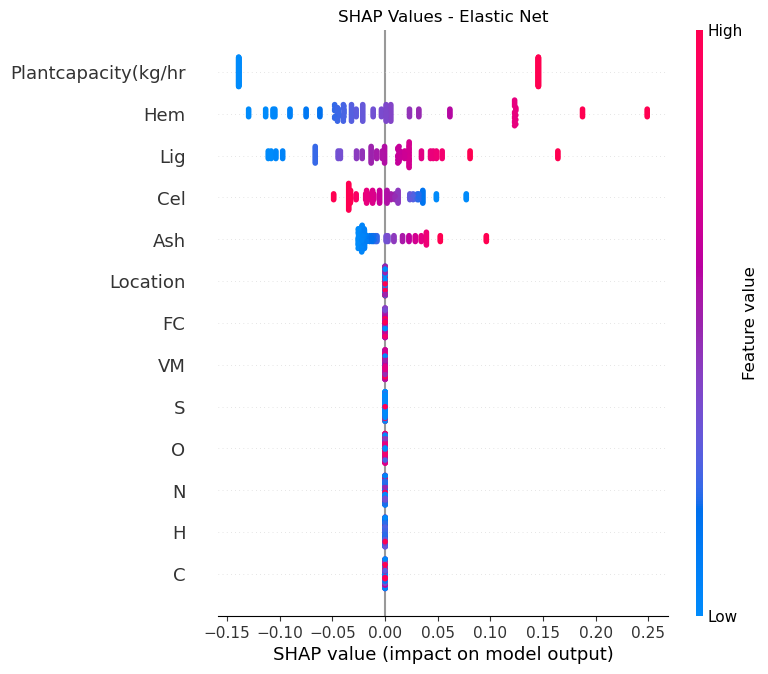

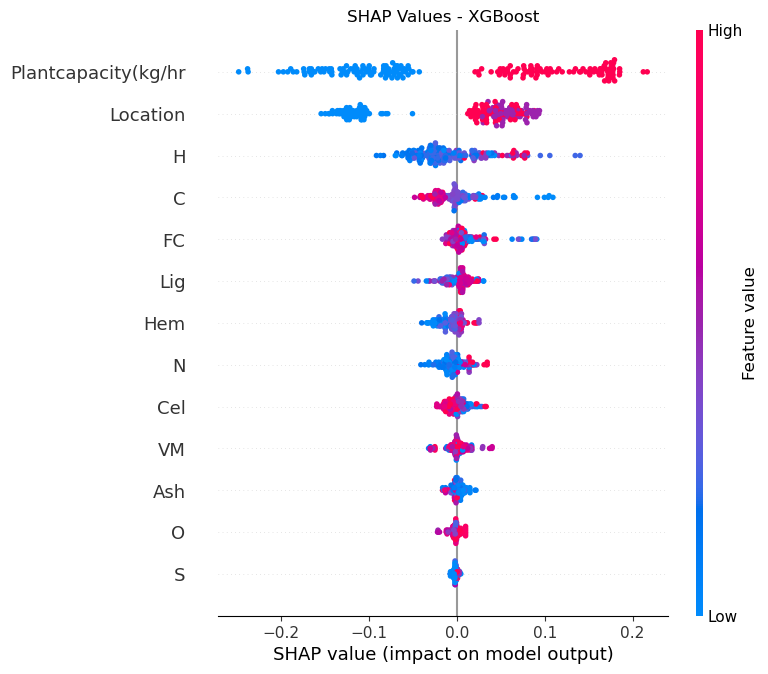

In [43]:
# Compute SHAP values for each model
shap_values_dict = {}
for model_name, model in models.items():
    # Fit the model
    model.fit(X_train, y_train)
    # Compute SHAP values
    if model_name in ["Random Forest", "Gradient Boosting", "XGBoost"]:
        
        
        explainer = shap.TreeExplainer(model)
    elif model_name in ["Linear Regression", "Elastic Net"]:
        explainer = shap.LinearExplainer(model, X_train)
    else:
        raise ValueError(f"Model {model_name} is not supported for SHAP computation.")
    shap_values = explainer.shap_values(X_test)
    shap_values_dict[model_name] = shap_values

# Plot SHAP values
for model_name, shap_values in shap_values_dict.items():
    shap.summary_plot(shap_values, X_test, show=False)
    plt.title(f'SHAP Values - {model_name}')
    plt.show()

In [48]:
import joblib

# Get the best performing model object
best_model = models['XGBoost']

best_model.fit(X, y)

# Save the best performing model using joblib
joblib.dump(best_model, 'best_model.joblib')

['best_model.joblib']

In [49]:
import joblib

# Load the model from the file
loaded_model = joblib.load('best_model.joblib')
# Make predictions
predictions = loaded_model.predict(X_test)

In [50]:
print(predictions)

[0.641092   0.6292514  0.69333816 0.8503896  1.1998978  0.780531
 0.63154274 0.7354188  0.6922579  0.75220317 0.75220317 0.67034036
 0.9104389  0.6681064  0.6389158  0.62650985 0.68838125 0.6508997
 0.6924965  0.6316164  0.6586042  0.6828327  0.63902545 0.90225834
 0.67968065 0.65332305 0.7274862  0.658583   0.6995463  0.66079885
 0.75225335 0.68487495 0.6674095  0.7410855  0.92756397 1.2765769
 0.8450361  0.6836475  0.78098786 0.74140847 0.8064491  0.8064491
 0.724703   0.9651901  0.7209523  0.6992517  0.6866021  0.7398156
 0.7062025  0.7397272  0.68812394 0.7023112  0.73653924 0.6859674
 0.9563202  0.73853874 0.69399375 0.77919626 0.70674807 0.75979155
 0.7055776  0.8097659  0.4061974  0.3963612  0.42923778 0.54569936
 0.7825895  0.4938393  0.39618742 0.45349327 0.4316579  0.47744608
 0.47744608 0.42549112 0.58249557 0.42124143 0.40378988 0.39731112
 0.43603322 0.40887234 0.43240538 0.40553707 0.42121795 0.4341657
 0.40552106 0.5724123  0.42656454 0.40733182 0.46480602 0.41054463
 0.